# Inference using Fastai - Debug

* Notebook failing on submissions
* This is for debug, predict on training data (asbfly) instead to figure out what is going wrong.
* First classifier rev: resnet18, no secondary labels, only rating 3 and above, reject waveoforms < .1 * max_range
    * Side note: This first classifier is awful.  Re-train this one after debug.  

## Imports

In [1]:
import os
import cv2

import numpy as np
import pandas as pd
import librosa
from tqdm.auto import tqdm

from fastai.vision.all import *

## Load test files

In [2]:
train = pd.read_csv('/kaggle/input/birdclef-2024/train_metadata.csv')

# Load list of audio files by parsing the test_soundscape folder.
test_audio_dir = '../input/birdclef-2024/test_soundscapes/'
train_audio_dir = '../input/birdclef-2024/train_audio/'

file_list = [f for f in sorted(os.listdir(train_audio_dir+'/asbfly/'))]   # debug
#file_list = [f for f in sorted(os.listdir(test_audio_dir))]

#file_list = [file.split('.')[0] for file in file_list if file.endswith('.ogg')]

print('Number of test soundscapes:', len(file_list))
train.head()

Number of test soundscapes: 105


,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,asbfly,[],['call'],39.2297,118.1987,Muscicapa dauurica,Asian Brown Flycatcher,Matt Slaymaker,Creative Commons Attribution-NonCommercial-ShareAlike 3.0,5.0,https://www.xeno-canto.org/134896,asbfly/XC134896.ogg
1,asbfly,[],['song'],51.4030,104.6401,Muscicapa dauurica,Asian Brown Flycatcher,Magnus Hellström,Creative Commons Attribution-NonCommercial-ShareAlike 3.0,2.5,https://www.xeno-canto.org/164848,asbfly/XC164848.ogg
2,asbfly,[],['song'],36.3319,127.3555,Muscicapa dauurica,Asian Brown Flycatcher,Stuart Fisher,Creative Commons Attribution-NonCommercial-ShareAlike 4.0,2.5,https://www.xeno-canto.org/175797,asbfly/XC175797.ogg
3,asbfly,[],['call'],21.1697,70.6005,Muscicapa dauurica,Asian Brown Flycatcher,vir joshi,Creative Commons Attribution-NonCommercial-ShareAlike 4.0,4.0,https://www.xeno-canto.org/207738,asbfly/XC207738.ogg
4,asbfly,[],['call'],15.5442,73.7733,Muscicapa dauurica,Asian Brown Flycatcher,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-ShareAlike 4.0,4.0,https://www.xeno-canto.org/209218,asbfly/XC209218.ogg


In [3]:
#file_list

## Load model

In [20]:
learn_inf = load_learner('/kaggle/input/birdclef-2024-models/2024_bCLEF_classifier_fastai_resnet18.pkl')

learn_inf.dls.vocab

learn_labels = list(learn_inf.dls.vocab)

In [21]:
print(learn_labels)
# learn_labels.index('eurcoo')

['asbfly', 'ashdro1', 'ashpri1', 'ashwoo2', 'asikoe2', 'asiope1', 'aspfly1', 'aspswi1', 'barfly1', 'barswa', 'bcnher', 'bkcbul1', 'bkrfla1', 'bkskit1', 'bkwsti', 'bladro1', 'blaeag1', 'blakit1', 'blhori1', 'blnmon1', 'blrwar1', 'bncwoo3', 'brakit1', 'brasta1', 'brcful1', 'brfowl1', 'brnhao1', 'brnshr', 'brodro1', 'brwjac1', 'brwowl1', 'btbeat1', 'bwfshr1', 'categr', 'chbeat1', 'cohcuc1', 'comfla1', 'comgre', 'comior1', 'comkin1', 'commoo3', 'commyn', 'compea', 'comros', 'comsan', 'comtai1', 'copbar1', 'crbsun2', 'cregos1', 'crfbar1', 'crseag1', 'dafbab1', 'darter2', 'eaywag1', 'emedov2', 'eucdov', 'eurbla2', 'eurcoo', 'forwag1', 'gargan', 'gloibi', 'goflea1', 'graher1', 'grbeat1', 'grecou1', 'greegr', 'grefla1', 'grehor1', 'grejun2', 'grenig1', 'grewar3', 'grnsan', 'grnwar1', 'grtdro1', 'gryfra', 'grynig2', 'grywag', 'gybpri1', 'gyhcaf1', 'heswoo1', 'hoopoe', 'houcro1', 'houspa', 'inbrob1', 'indpit1', 'indrob1', 'indrol2', 'indtit1', 'ingori1', 'inpher1', 'insbab1', 'insowl1', 'integr'

57

Run inference

  0%|          | 0/105 [00:00<?, ?it/s]

file: ../input/birdclef-2024/train_audio//asbfly/XC134896.ogg


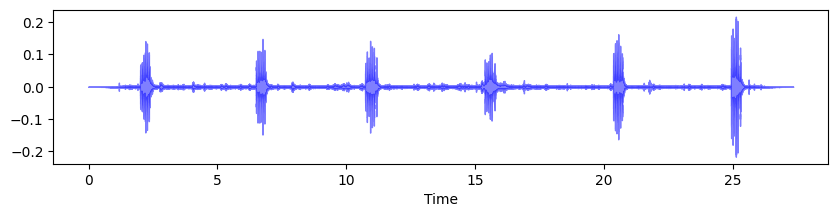

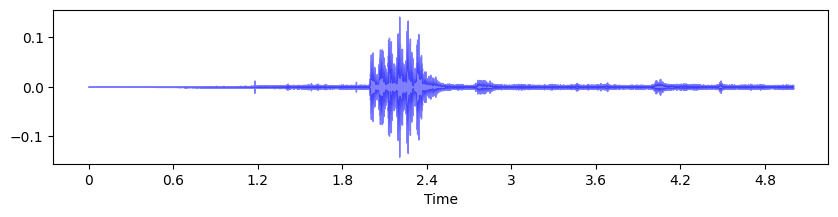

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


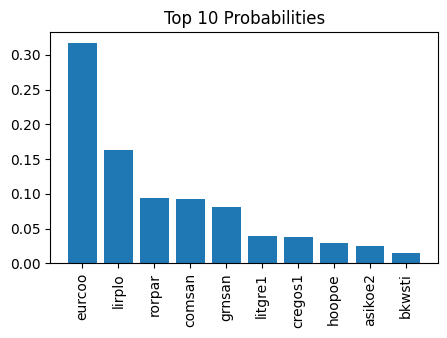

file: ../input/birdclef-2024/train_audio//asbfly/XC164848.ogg


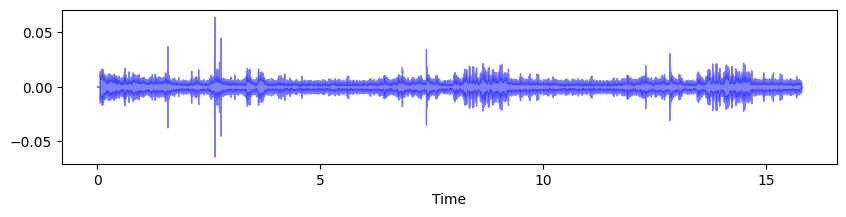

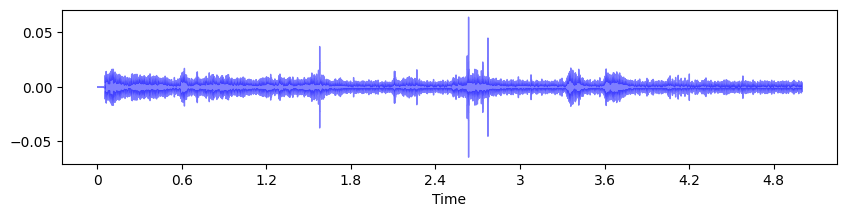

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


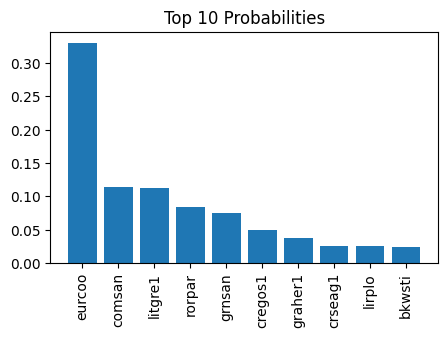

file: ../input/birdclef-2024/train_audio//asbfly/XC175797.ogg


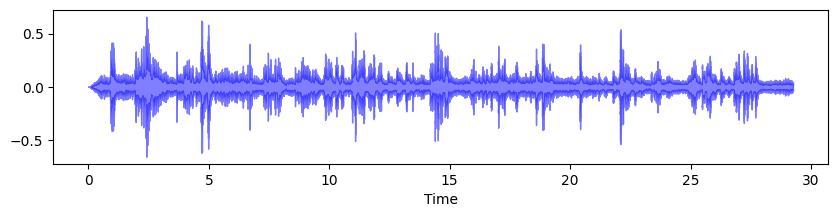

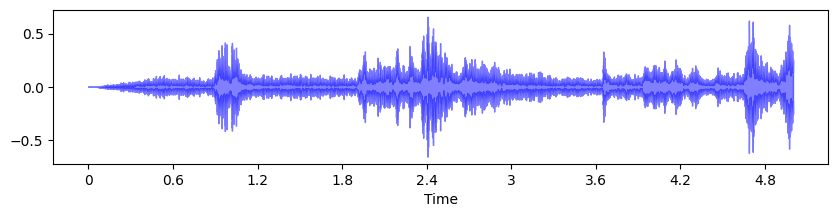

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


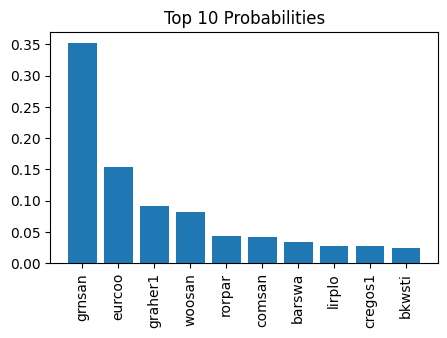

file: ../input/birdclef-2024/train_audio//asbfly/XC207738.ogg


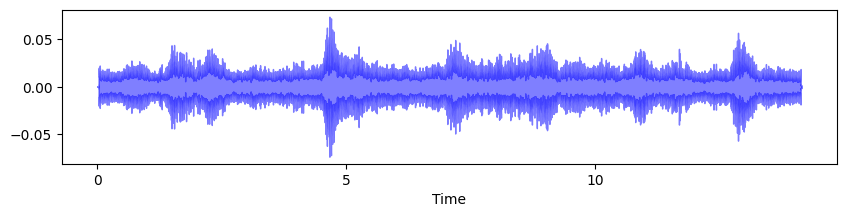

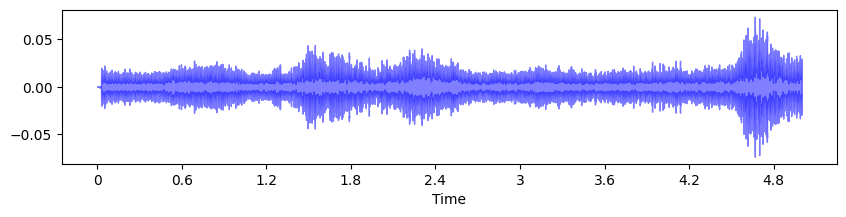

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


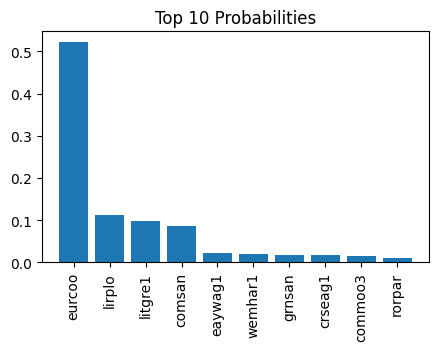

file: ../input/birdclef-2024/train_audio//asbfly/XC209218.ogg


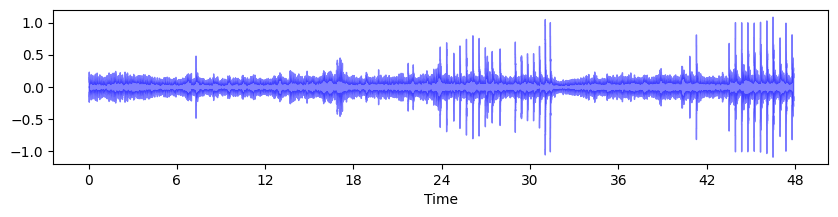

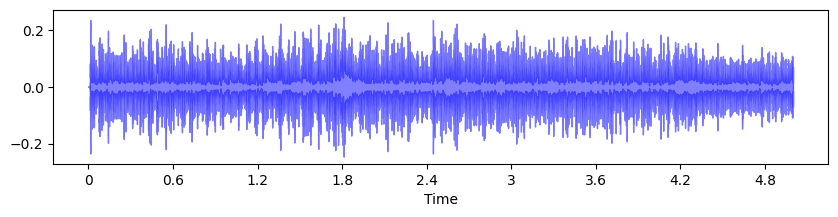

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


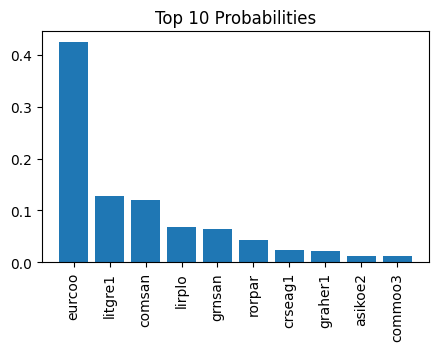

file: ../input/birdclef-2024/train_audio//asbfly/XC209219.ogg


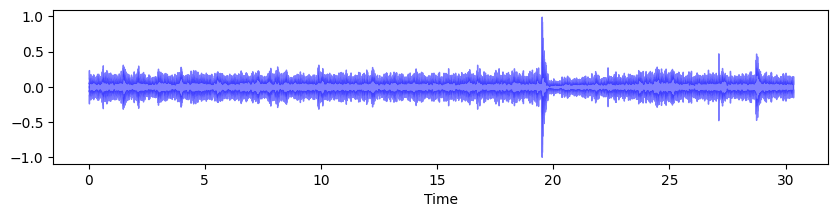

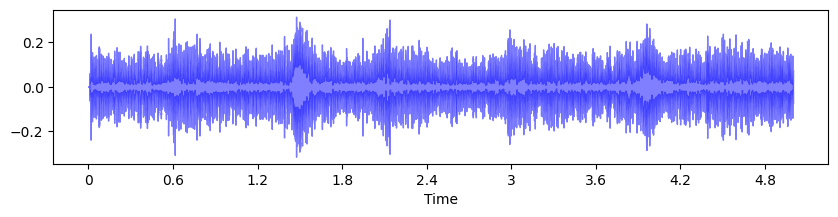

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


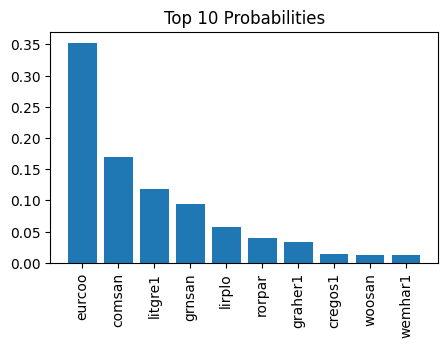

file: ../input/birdclef-2024/train_audio//asbfly/XC267679.ogg


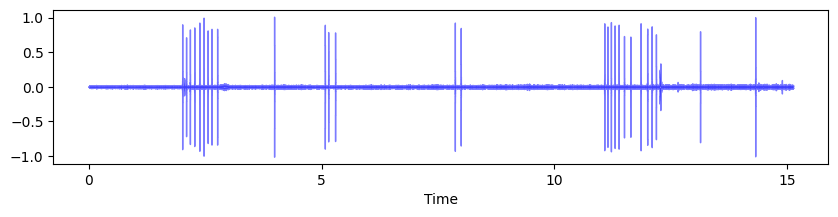

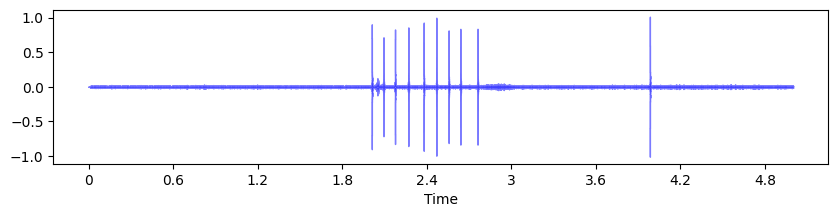

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


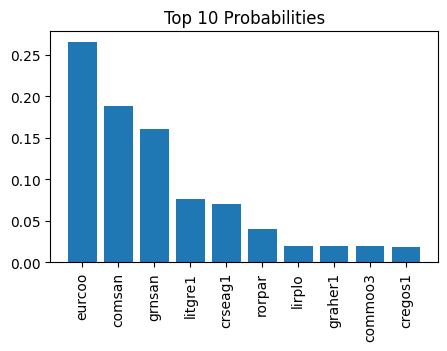

file: ../input/birdclef-2024/train_audio//asbfly/XC267680.ogg


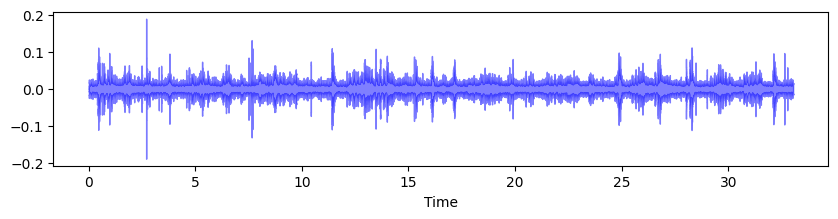

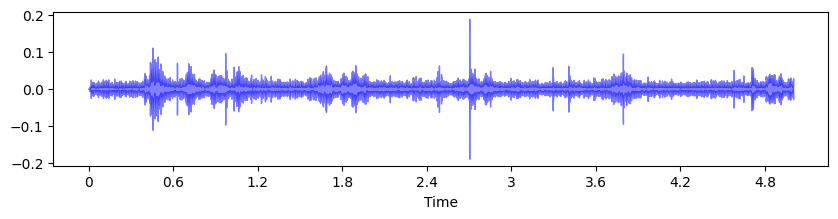

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


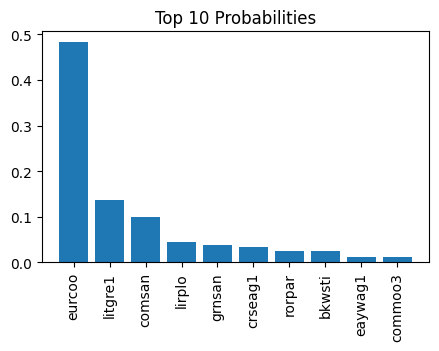

file: ../input/birdclef-2024/train_audio//asbfly/XC267681.ogg


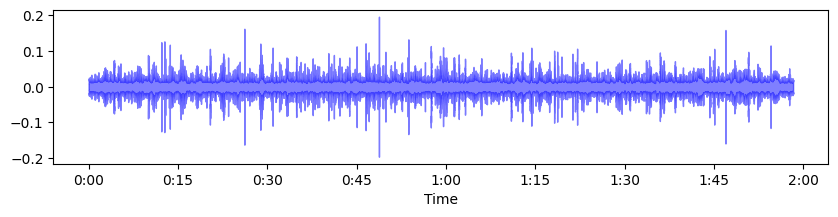

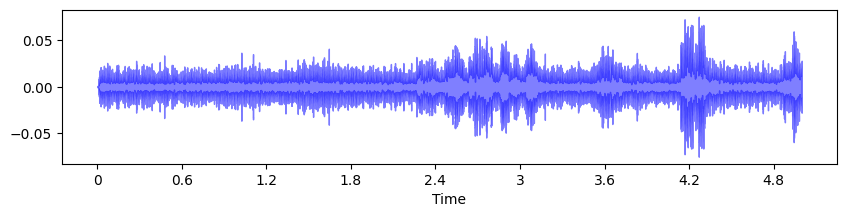

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


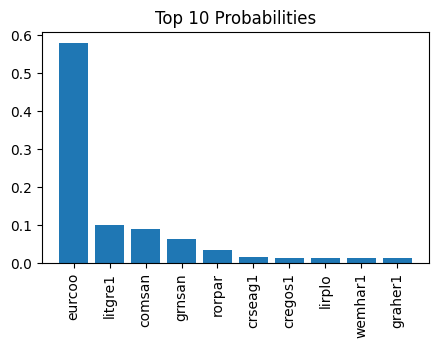

file: ../input/birdclef-2024/train_audio//asbfly/XC267682.ogg


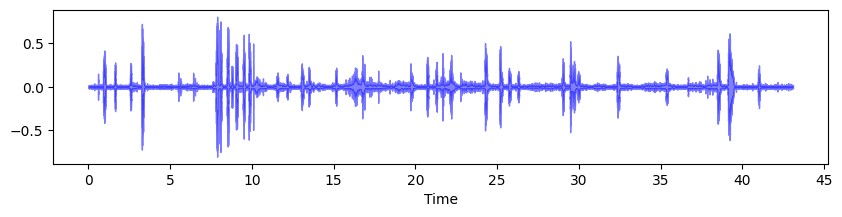

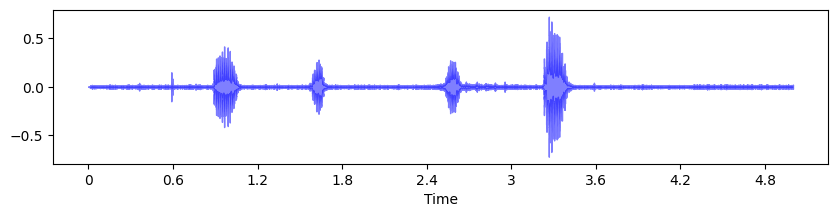

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


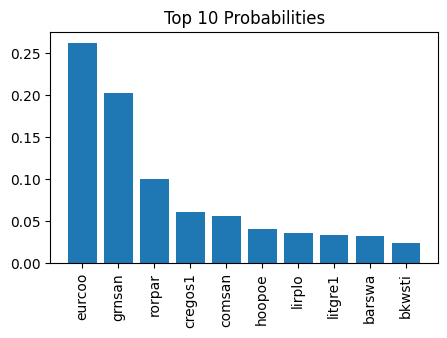

file: ../input/birdclef-2024/train_audio//asbfly/XC267683.ogg


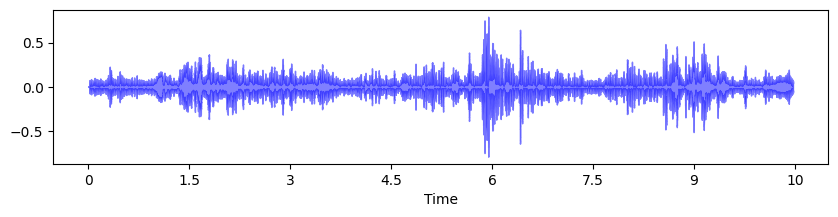

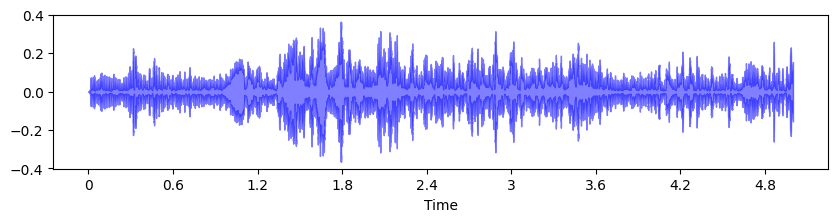

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


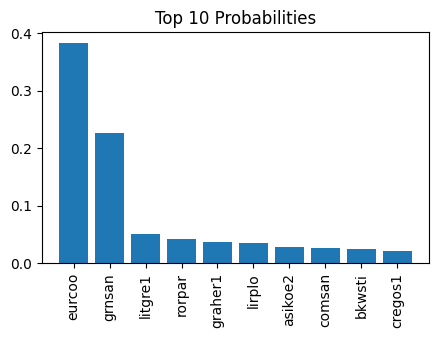

file: ../input/birdclef-2024/train_audio//asbfly/XC291450.ogg


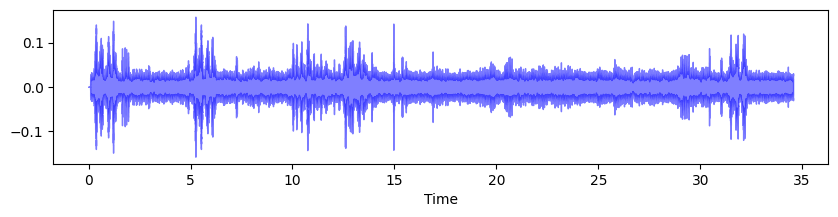

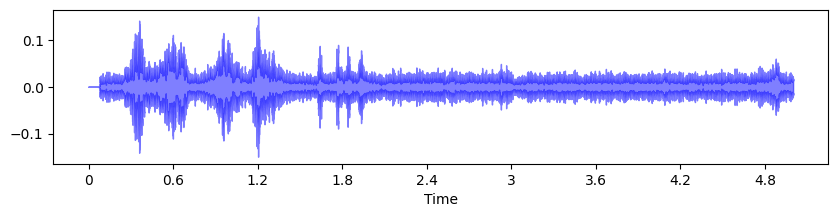

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


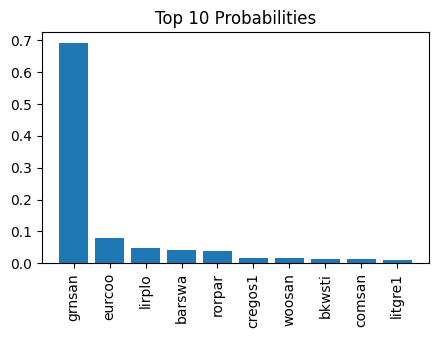

file: ../input/birdclef-2024/train_audio//asbfly/XC305518.ogg


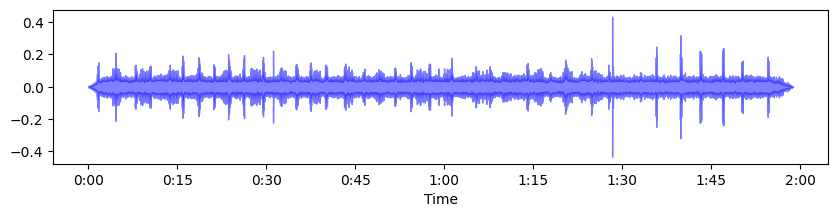

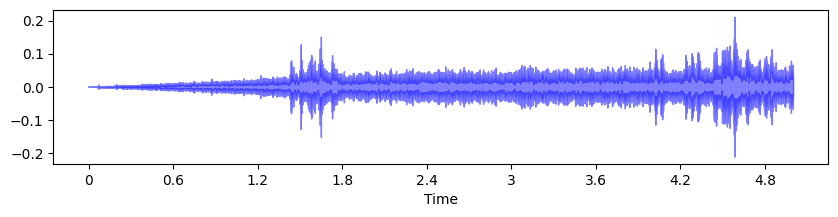

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


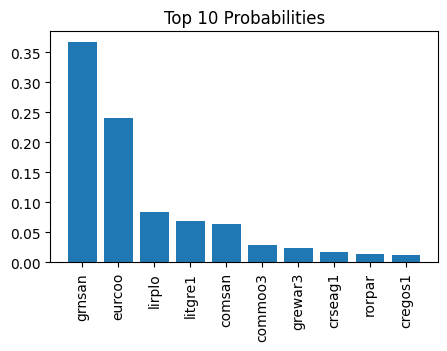

file: ../input/birdclef-2024/train_audio//asbfly/XC309402.ogg


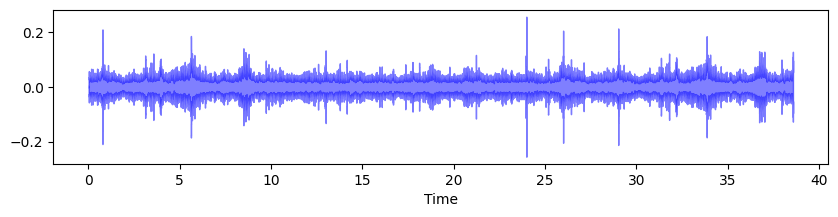

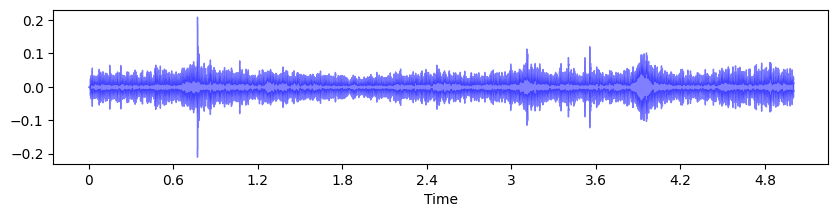

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


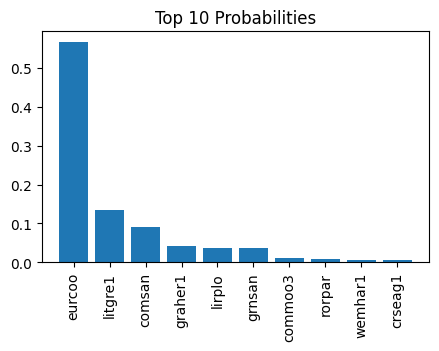

file: ../input/birdclef-2024/train_audio//asbfly/XC312456.ogg


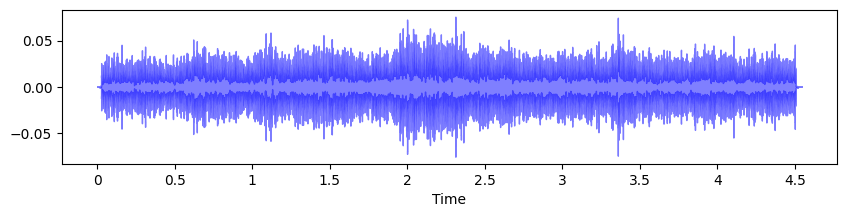

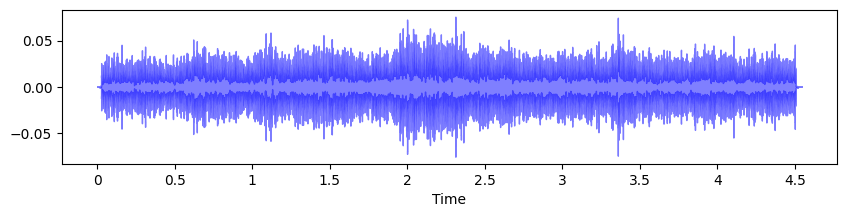

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


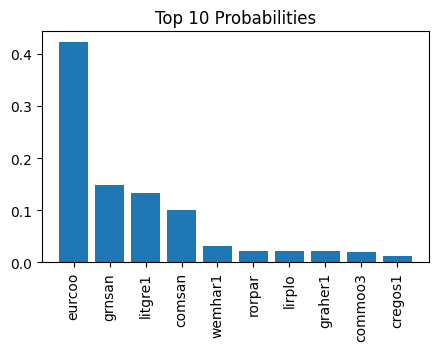

file: ../input/birdclef-2024/train_audio//asbfly/XC313835.ogg


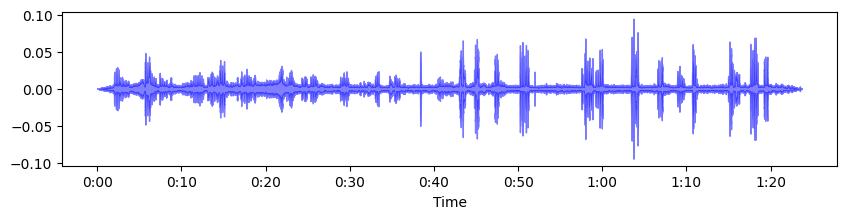

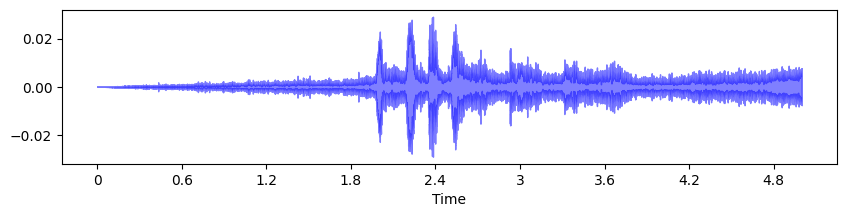

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


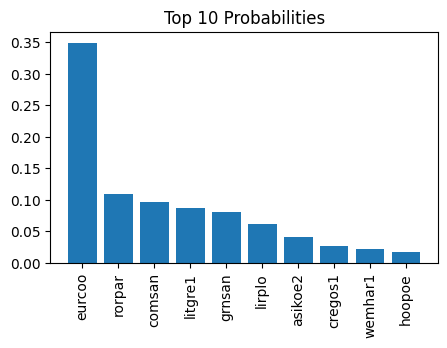

file: ../input/birdclef-2024/train_audio//asbfly/XC329259.ogg


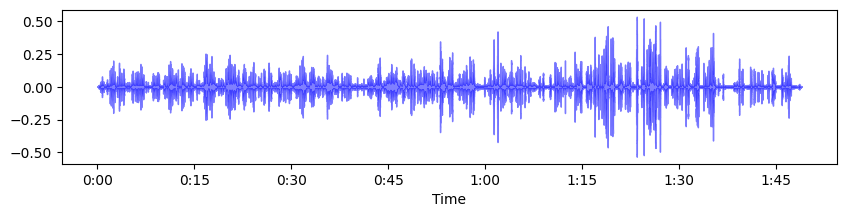

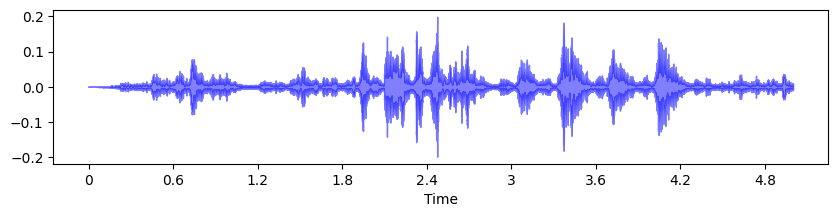

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


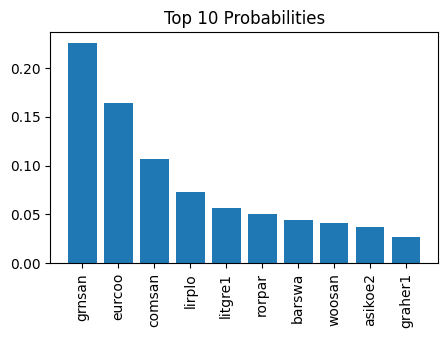

file: ../input/birdclef-2024/train_audio//asbfly/XC341611.ogg


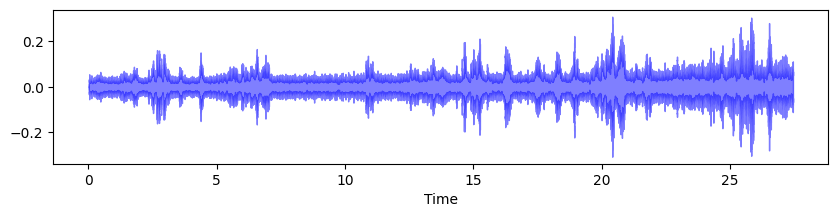

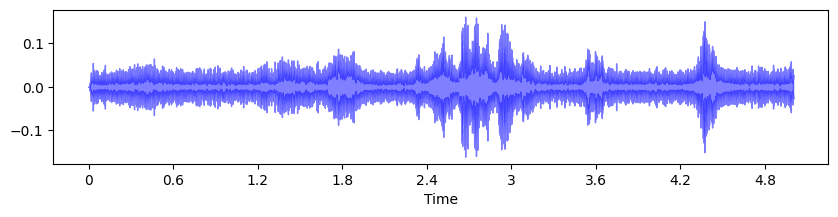

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


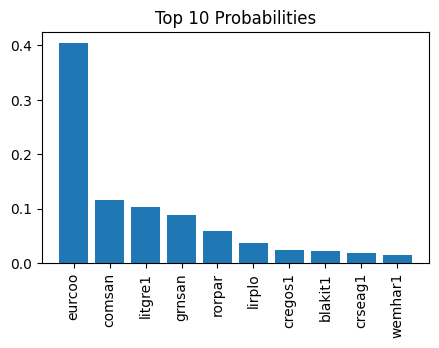

file: ../input/birdclef-2024/train_audio//asbfly/XC341612.ogg


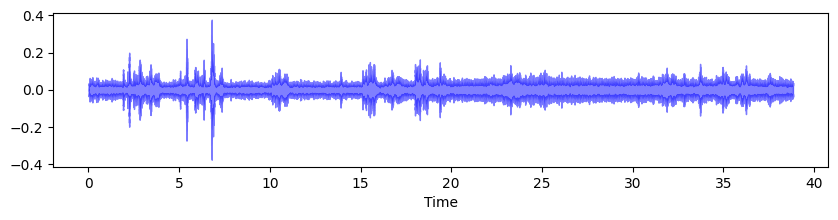

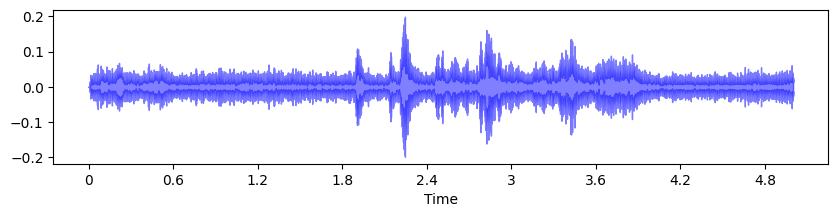

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


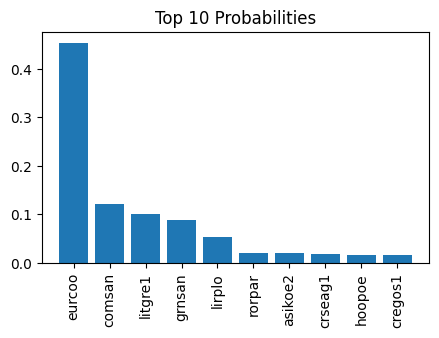

file: ../input/birdclef-2024/train_audio//asbfly/XC342037.ogg


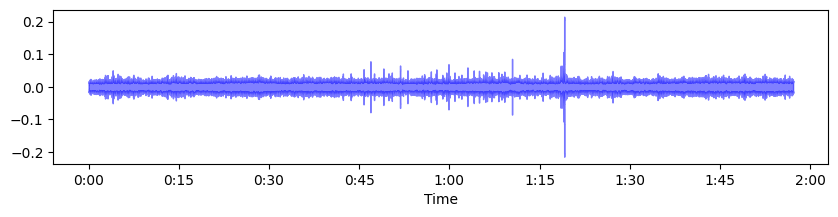

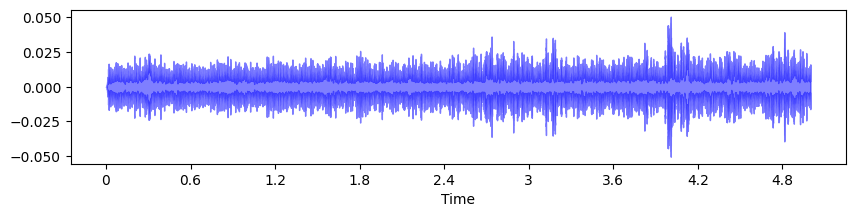

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


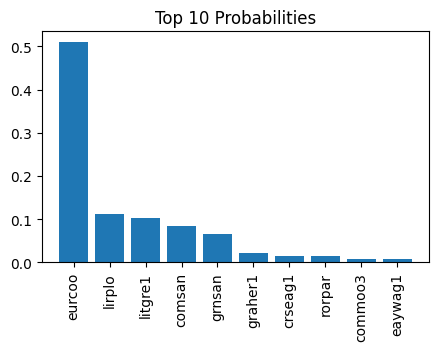

file: ../input/birdclef-2024/train_audio//asbfly/XC342638.ogg


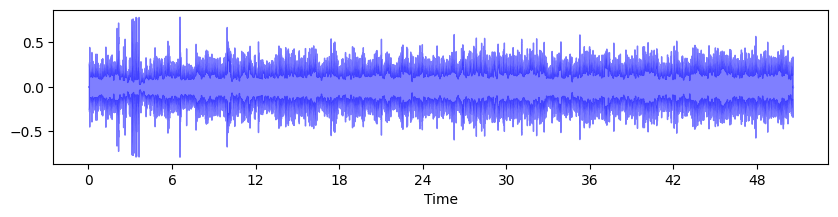

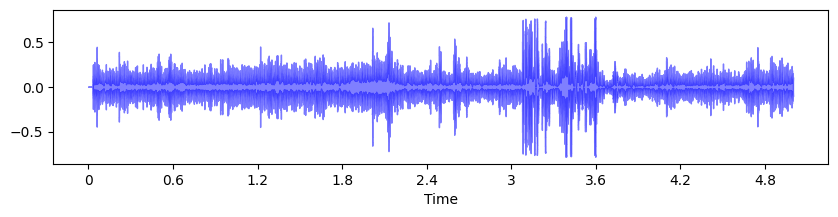

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


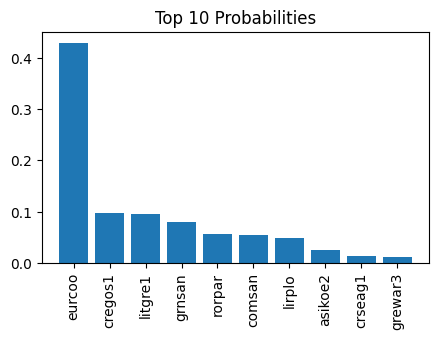

file: ../input/birdclef-2024/train_audio//asbfly/XC347563.ogg


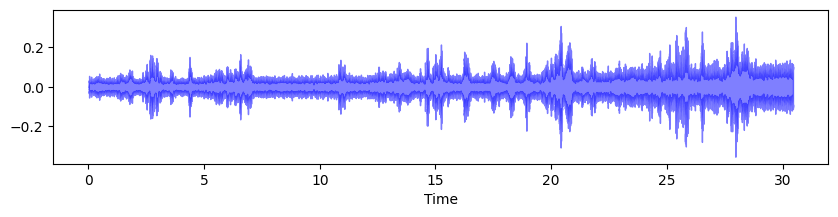

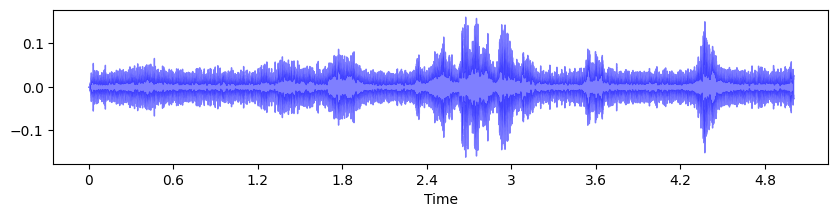

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


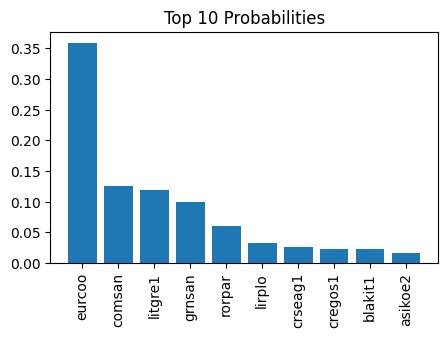

file: ../input/birdclef-2024/train_audio//asbfly/XC347938.ogg


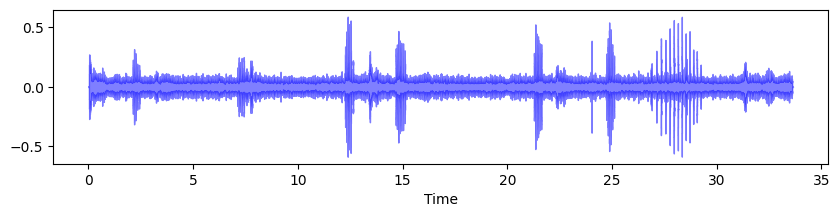

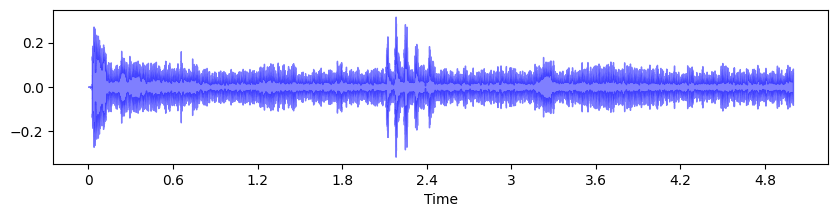

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


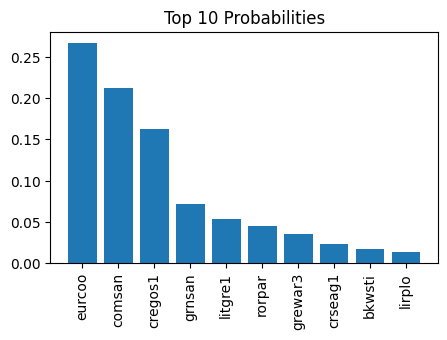

file: ../input/birdclef-2024/train_audio//asbfly/XC374520.ogg


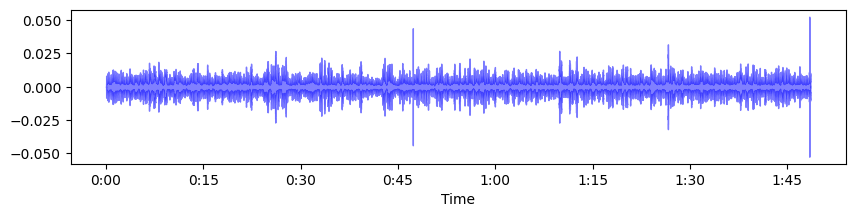

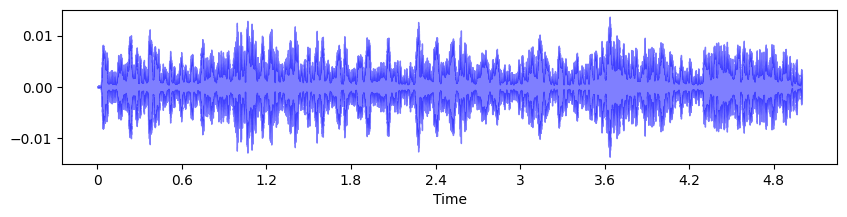

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


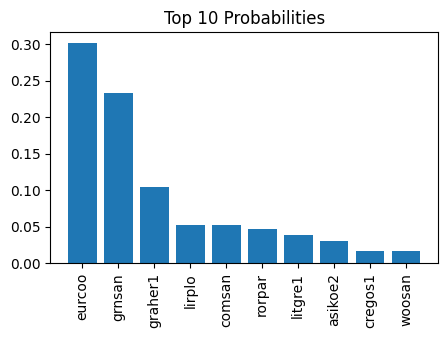

file: ../input/birdclef-2024/train_audio//asbfly/XC376509.ogg


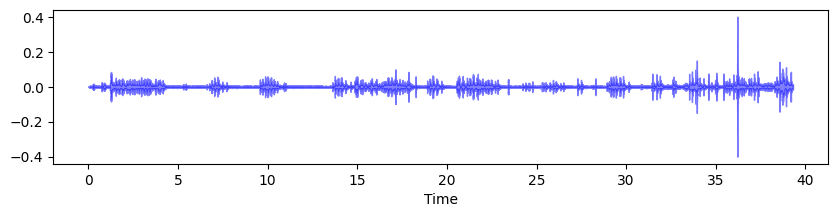

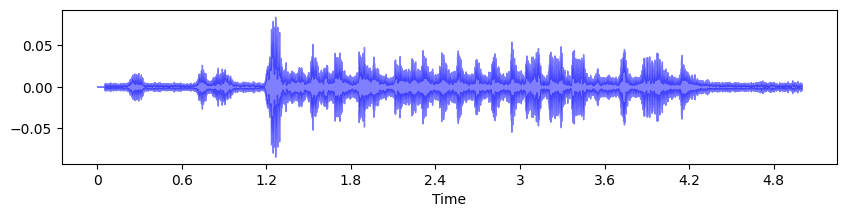

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


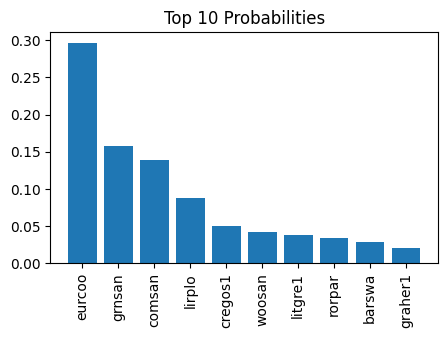

file: ../input/birdclef-2024/train_audio//asbfly/XC396237.ogg


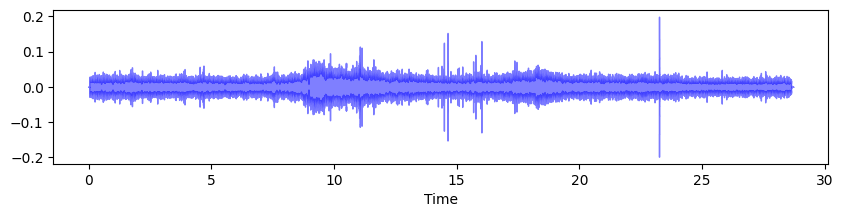

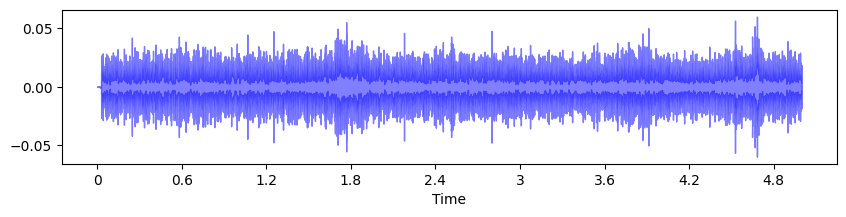

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


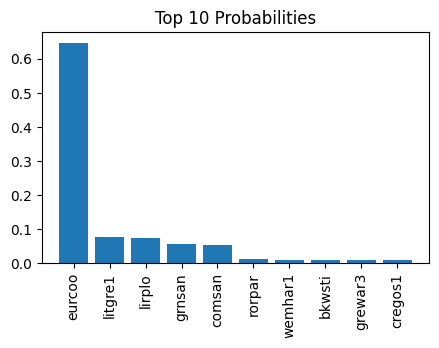

file: ../input/birdclef-2024/train_audio//asbfly/XC396238.ogg


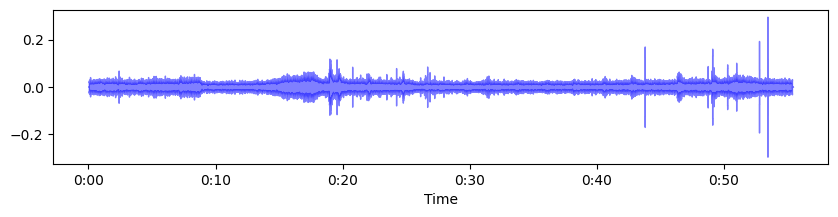

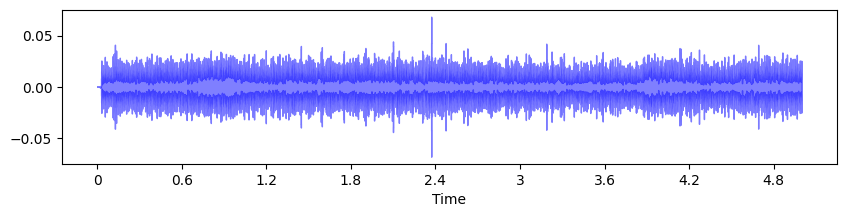

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


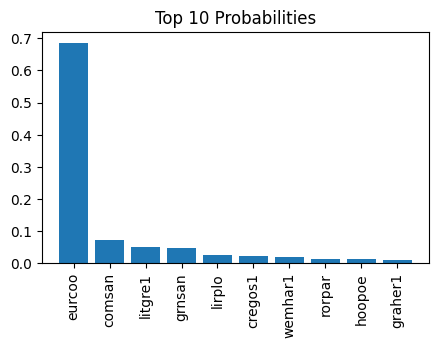

file: ../input/birdclef-2024/train_audio//asbfly/XC399102.ogg


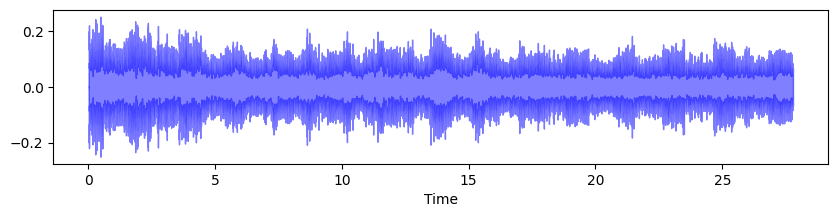

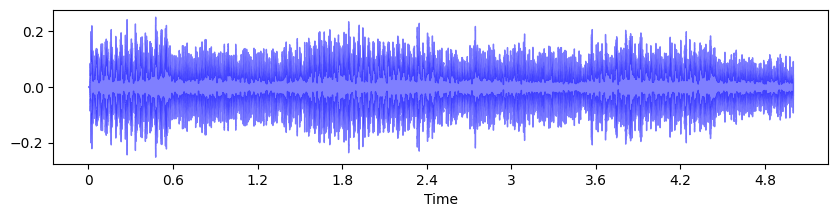

Interval prediction: lirplo, pred_idx: 105, bird_idx: 181


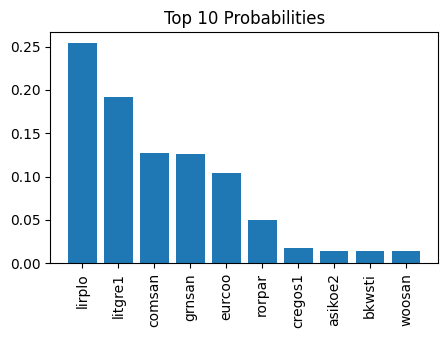

file: ../input/birdclef-2024/train_audio//asbfly/XC405069.ogg


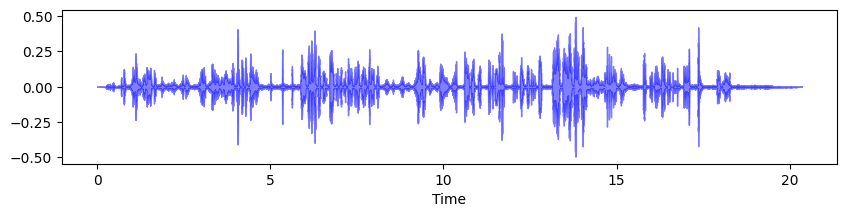

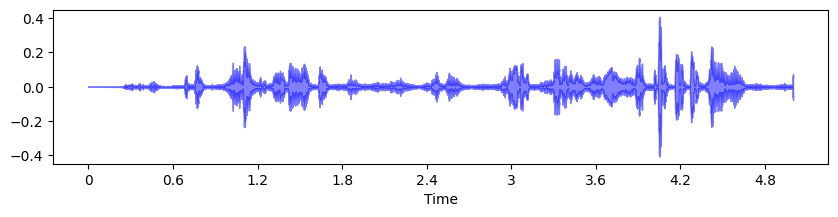

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


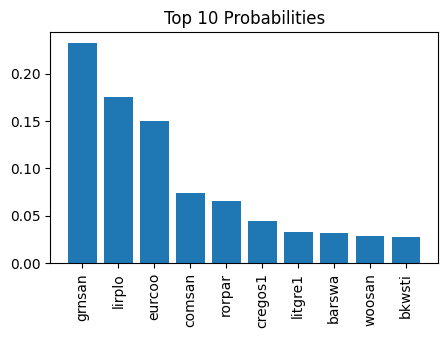

file: ../input/birdclef-2024/train_audio//asbfly/XC412227.ogg


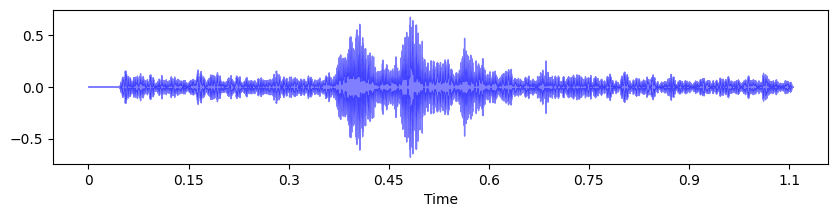

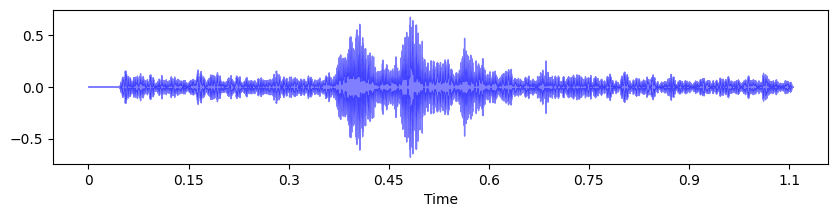

Interval prediction: cregos1, pred_idx: 48, bird_idx: 181


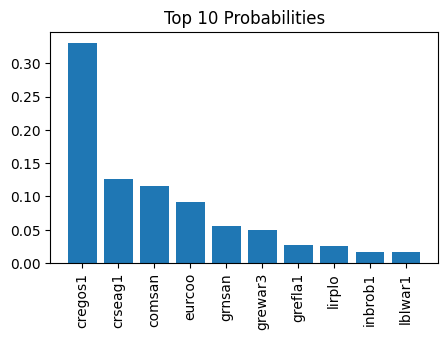

file: ../input/birdclef-2024/train_audio//asbfly/XC412228.ogg


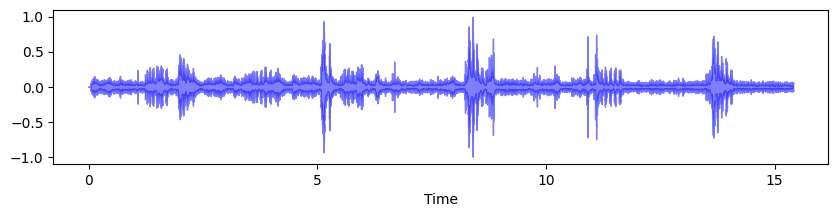

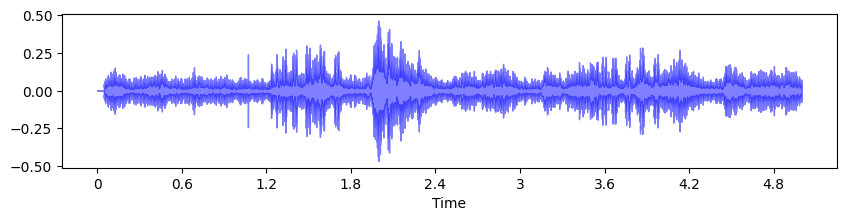

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


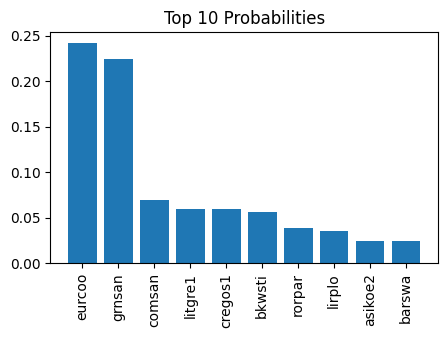

file: ../input/birdclef-2024/train_audio//asbfly/XC441145.ogg


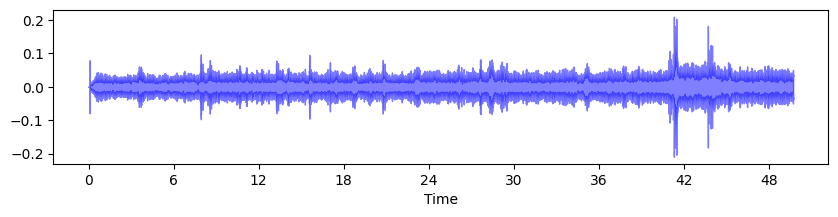

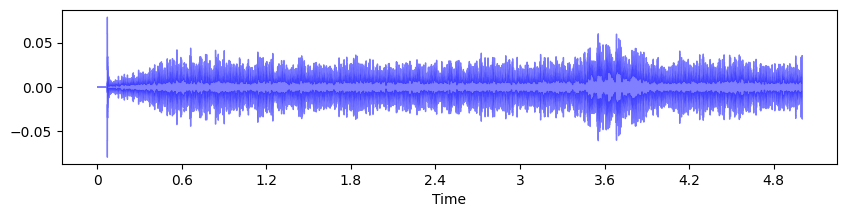

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


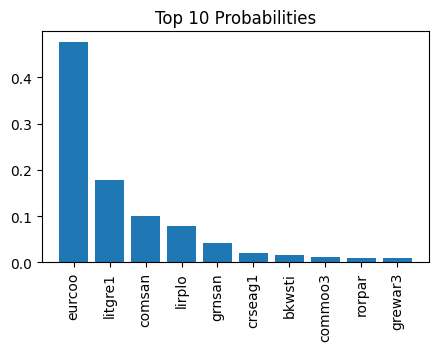

file: ../input/birdclef-2024/train_audio//asbfly/XC453302.ogg


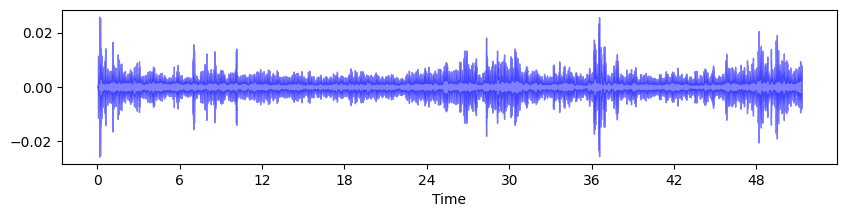

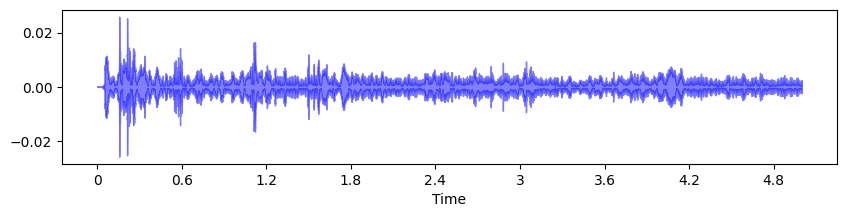

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


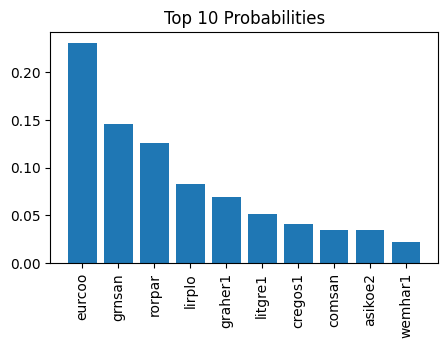

file: ../input/birdclef-2024/train_audio//asbfly/XC464609.ogg


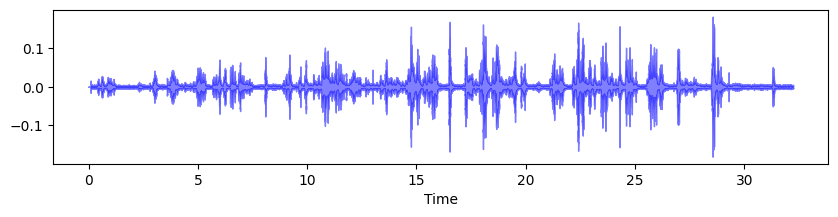

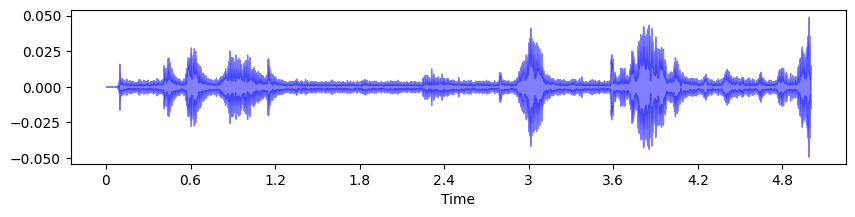

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


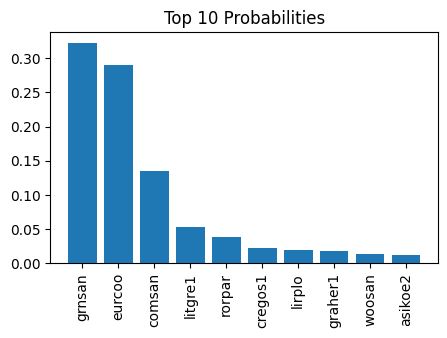

file: ../input/birdclef-2024/train_audio//asbfly/XC484489.ogg


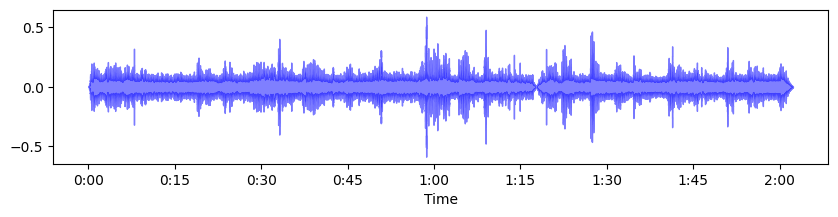

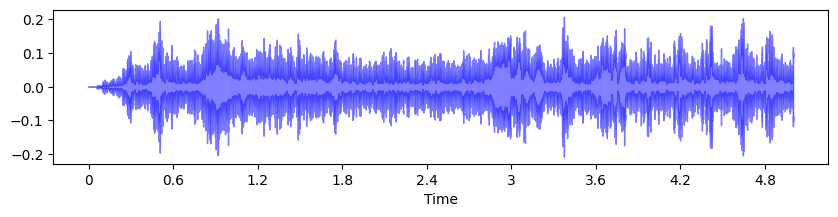

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


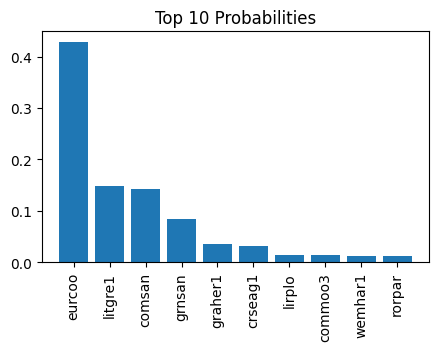

file: ../input/birdclef-2024/train_audio//asbfly/XC49755.ogg


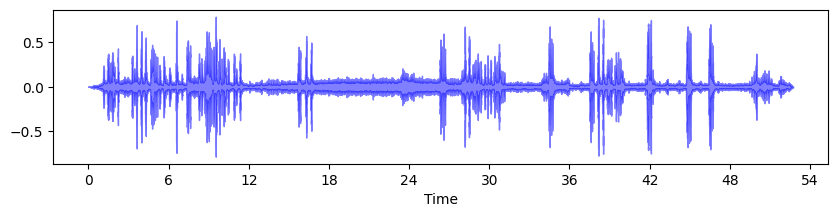

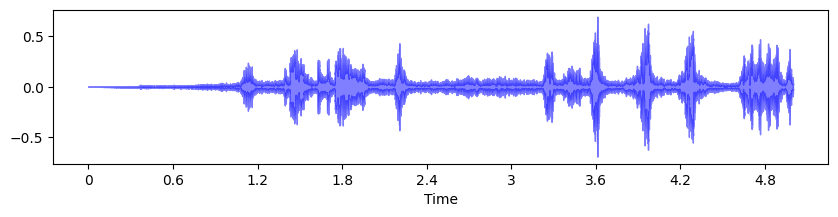

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


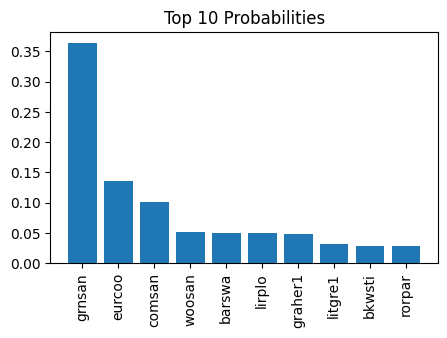

file: ../input/birdclef-2024/train_audio//asbfly/XC499134.ogg


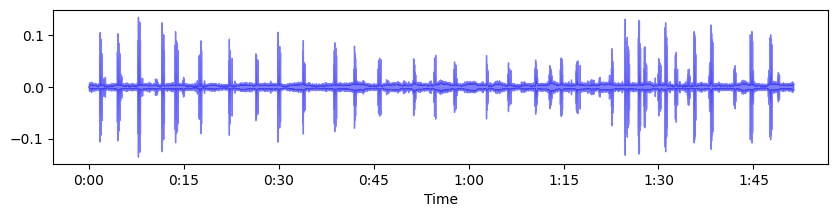

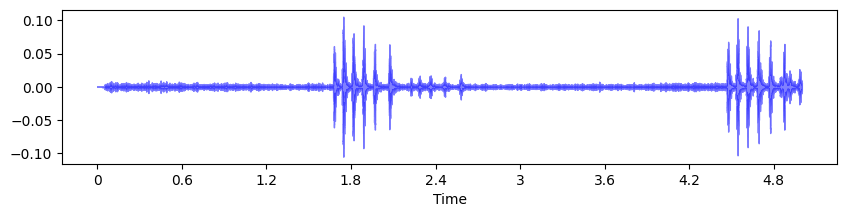

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


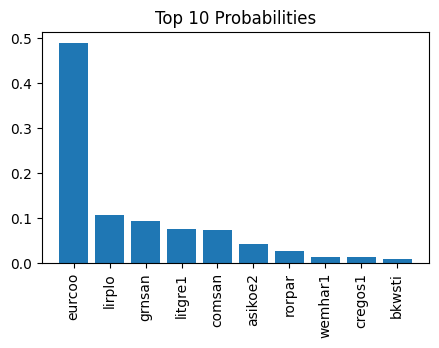

file: ../input/birdclef-2024/train_audio//asbfly/XC505369.ogg


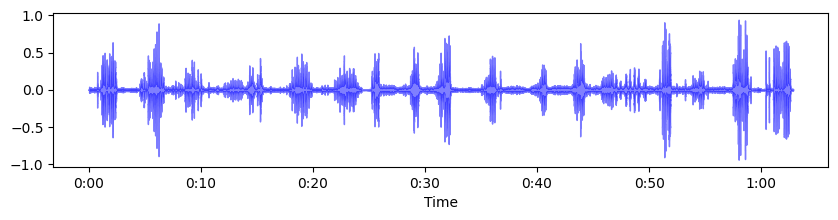

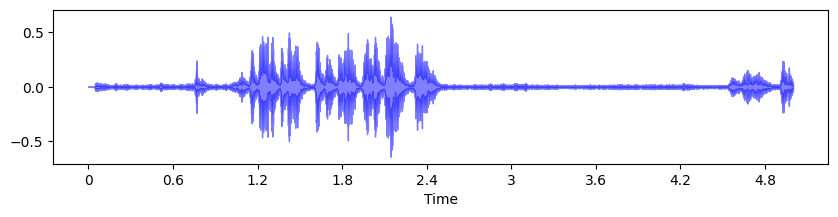

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


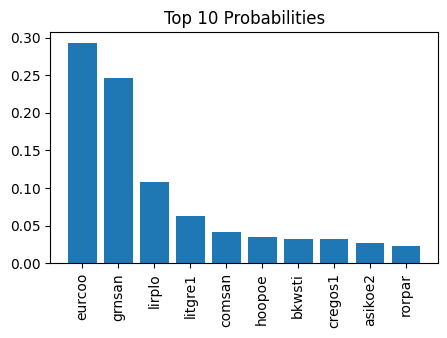

file: ../input/birdclef-2024/train_audio//asbfly/XC508268.ogg


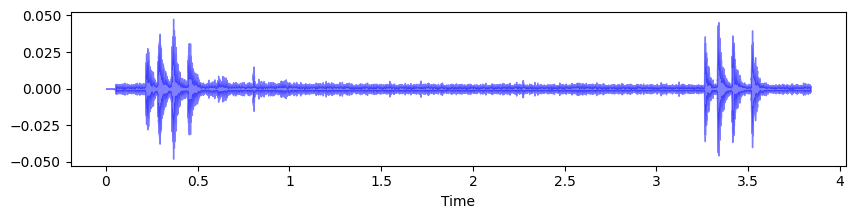

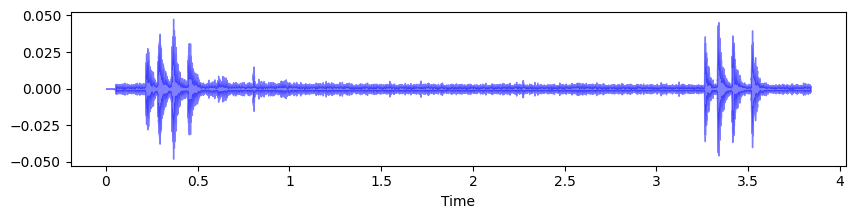

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


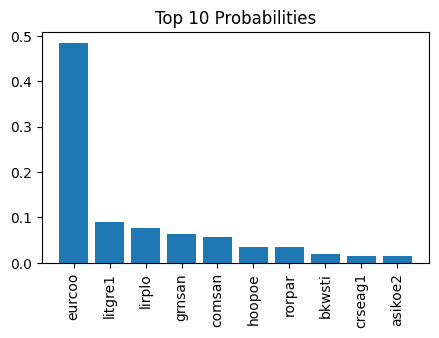

file: ../input/birdclef-2024/train_audio//asbfly/XC528852.ogg


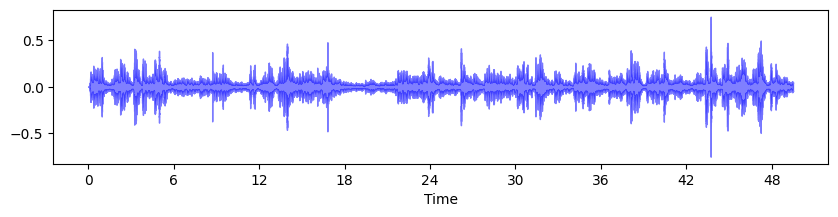

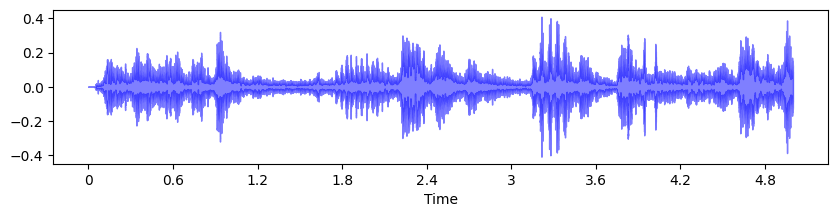

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


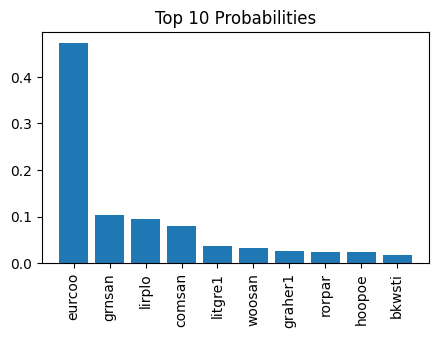

file: ../input/birdclef-2024/train_audio//asbfly/XC530877.ogg


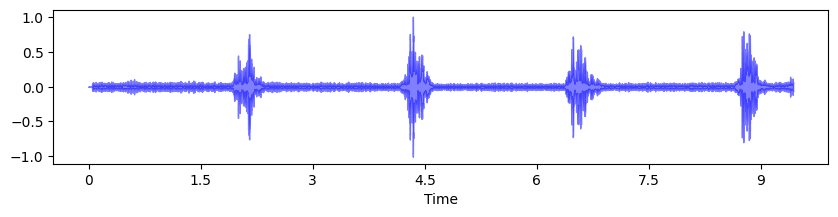

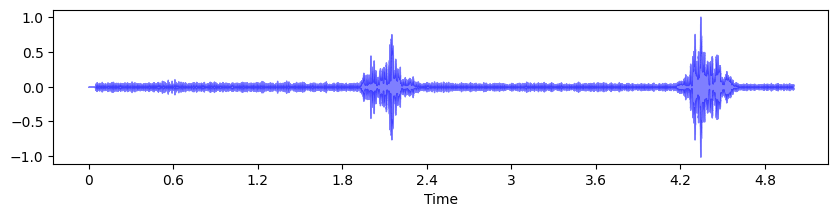

Interval prediction: cregos1, pred_idx: 48, bird_idx: 181


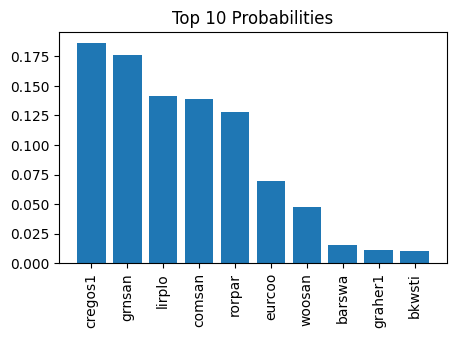

file: ../input/birdclef-2024/train_audio//asbfly/XC554430.ogg


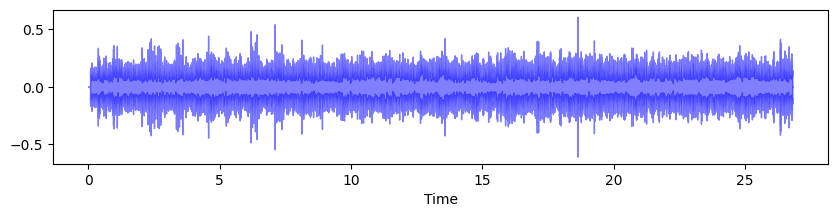

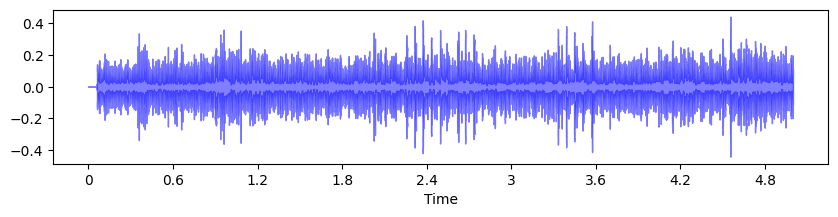

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


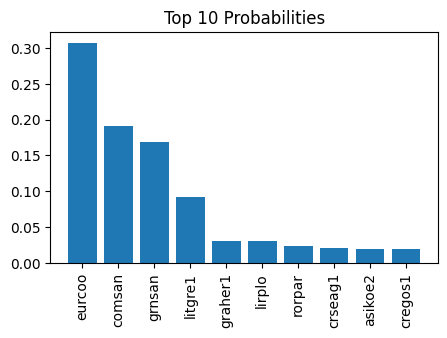

file: ../input/birdclef-2024/train_audio//asbfly/XC575547.ogg


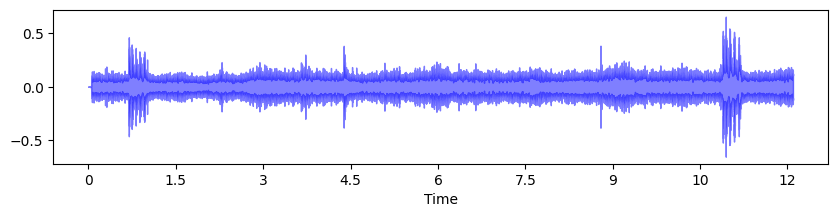

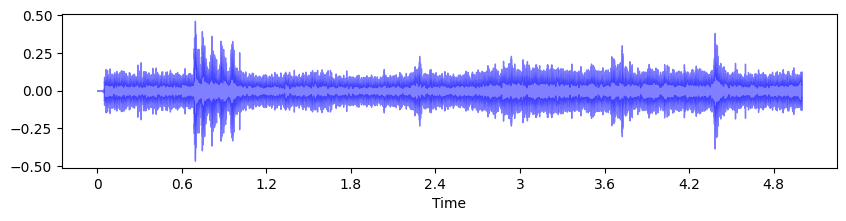

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


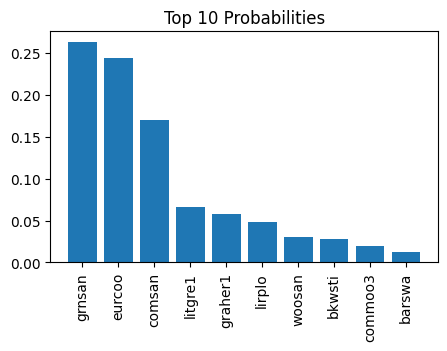

file: ../input/birdclef-2024/train_audio//asbfly/XC578908.ogg


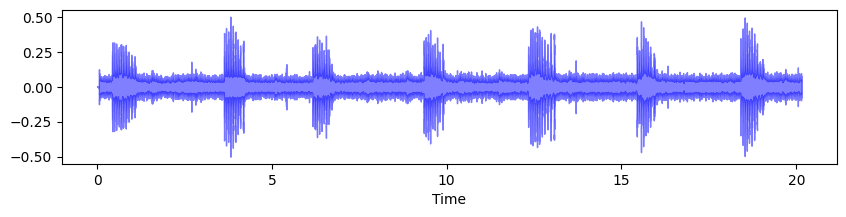

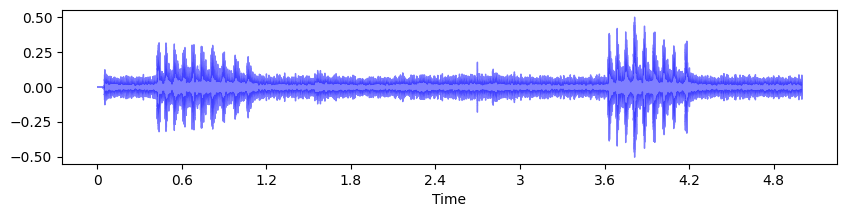

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


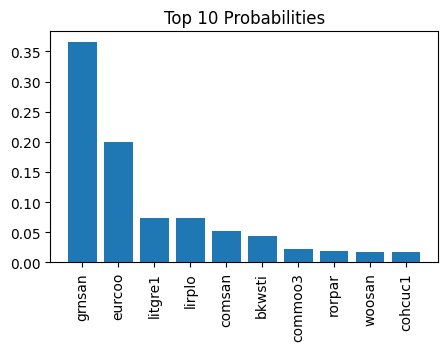

file: ../input/birdclef-2024/train_audio//asbfly/XC578909.ogg


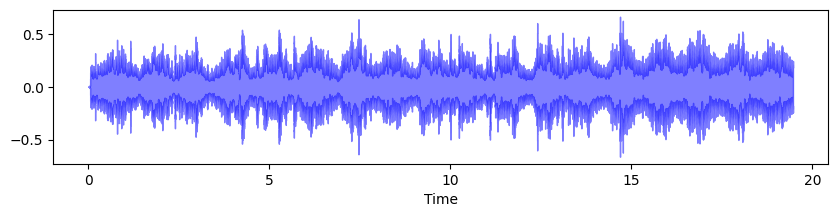

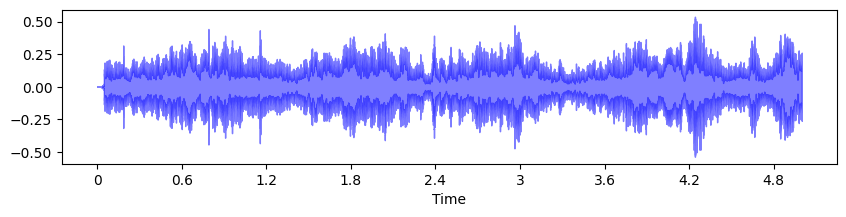

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


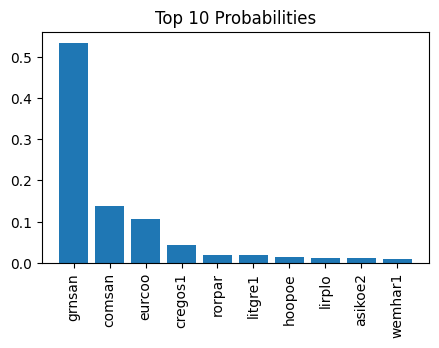

file: ../input/birdclef-2024/train_audio//asbfly/XC589132.ogg


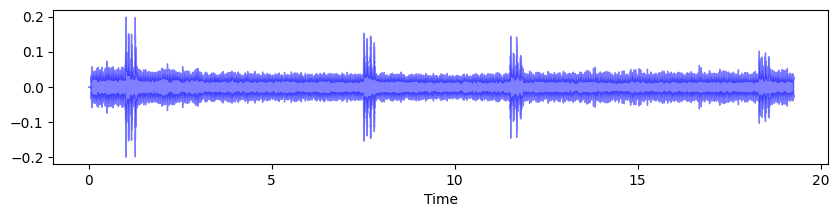

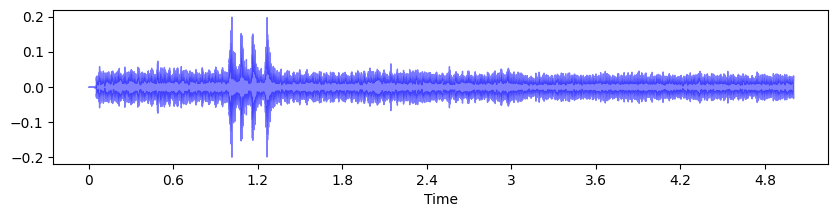

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


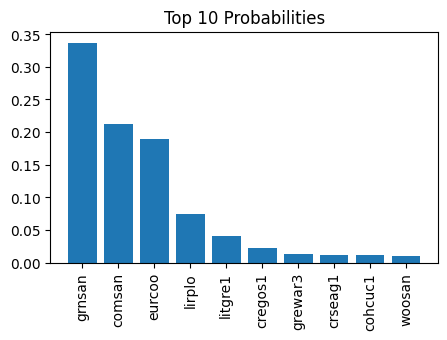

file: ../input/birdclef-2024/train_audio//asbfly/XC596043.ogg


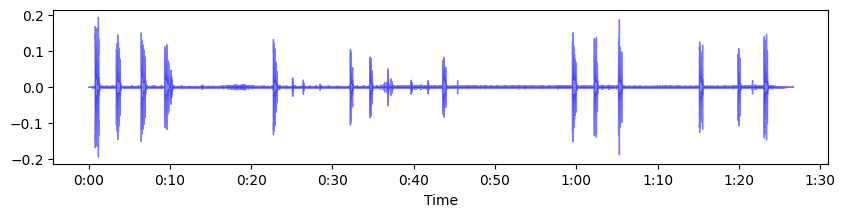

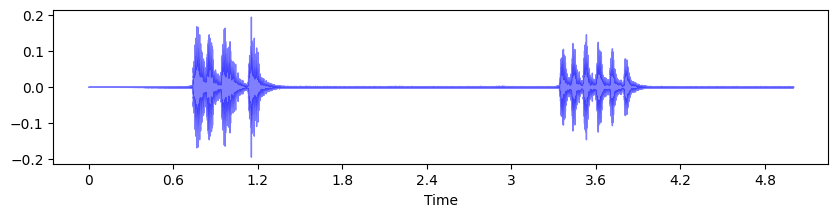

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


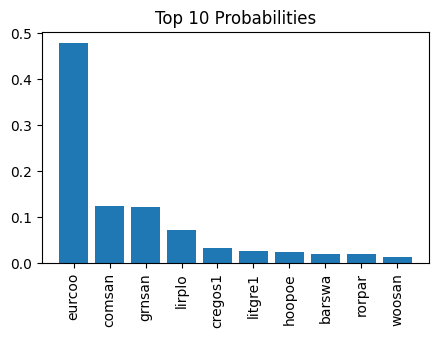

file: ../input/birdclef-2024/train_audio//asbfly/XC600171.ogg


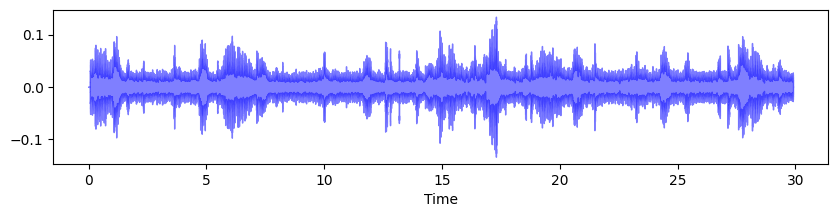

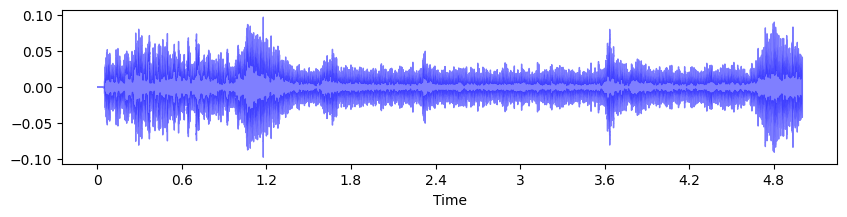

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


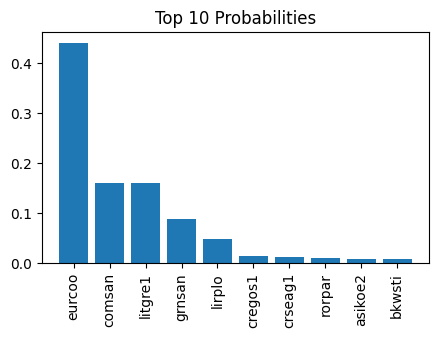

file: ../input/birdclef-2024/train_audio//asbfly/XC610733.ogg


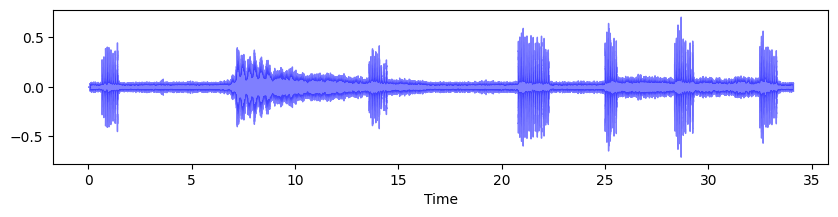

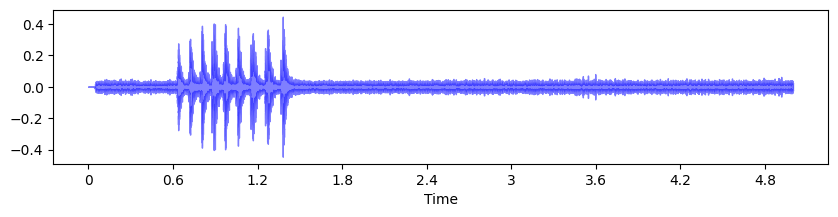

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


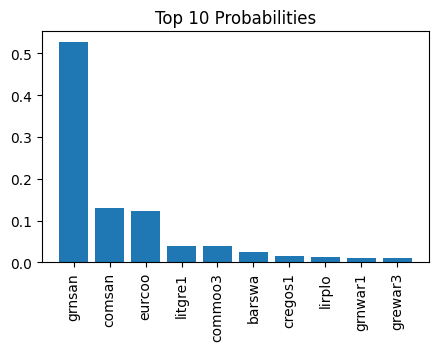

file: ../input/birdclef-2024/train_audio//asbfly/XC610734.ogg


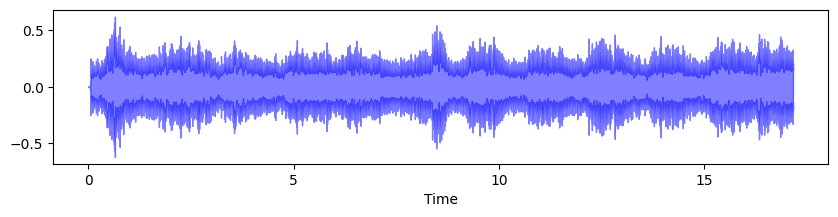

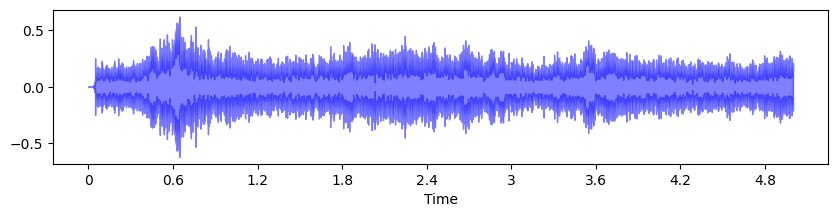

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


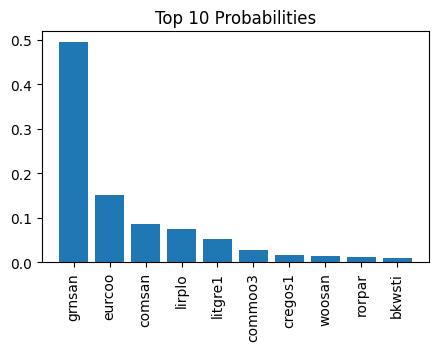

file: ../input/birdclef-2024/train_audio//asbfly/XC610735.ogg


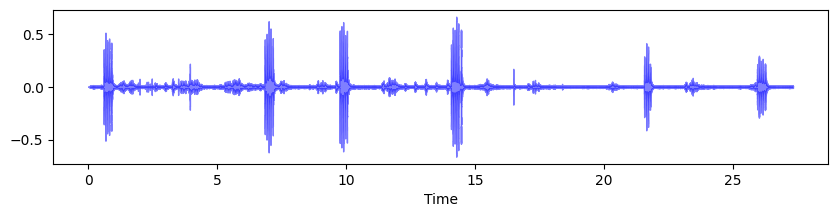

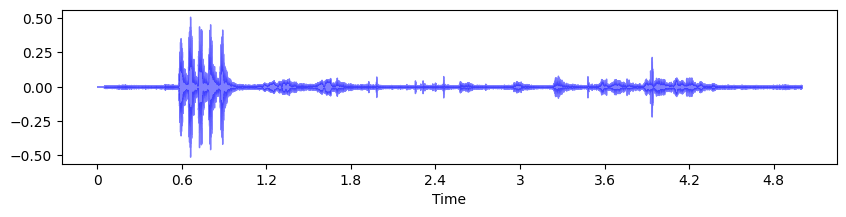

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


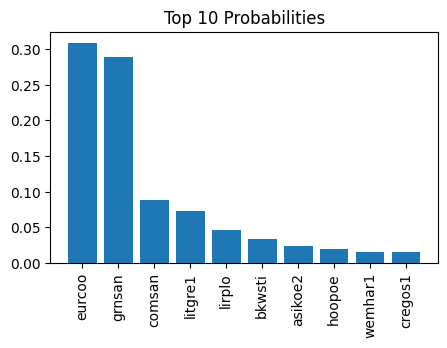

file: ../input/birdclef-2024/train_audio//asbfly/XC629846.ogg


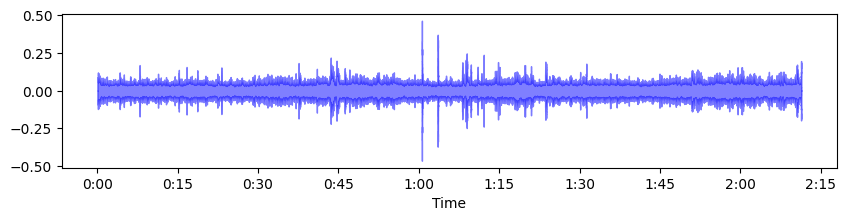

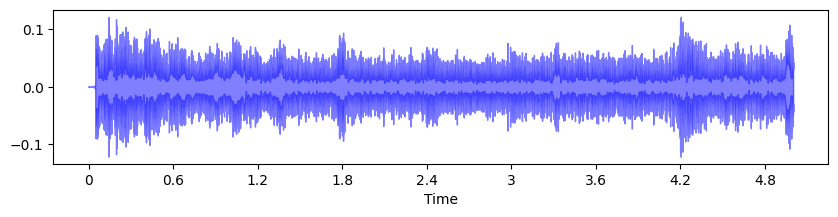

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


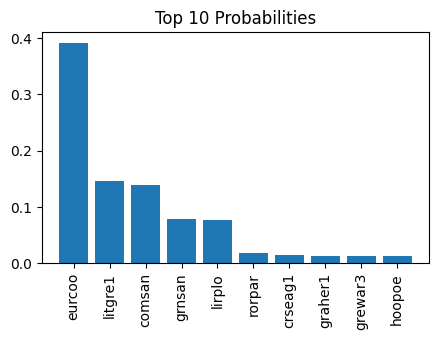

file: ../input/birdclef-2024/train_audio//asbfly/XC629847.ogg


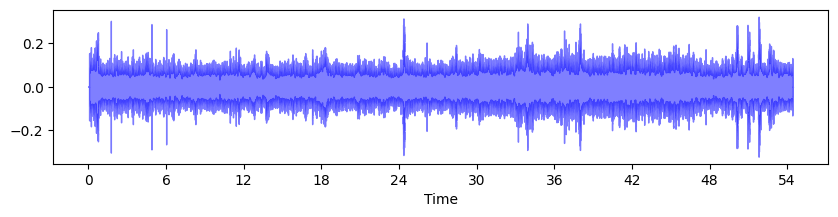

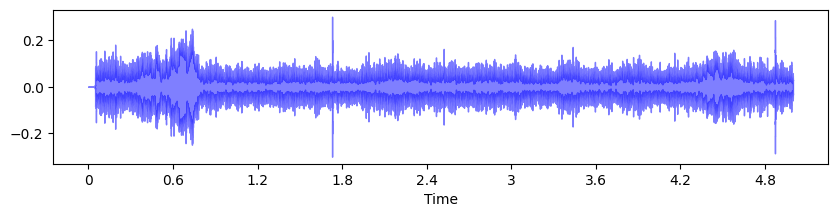

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


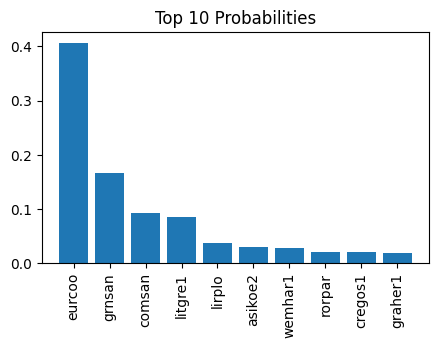

file: ../input/birdclef-2024/train_audio//asbfly/XC643642.ogg


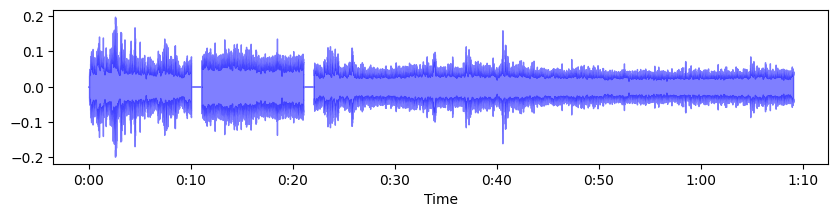

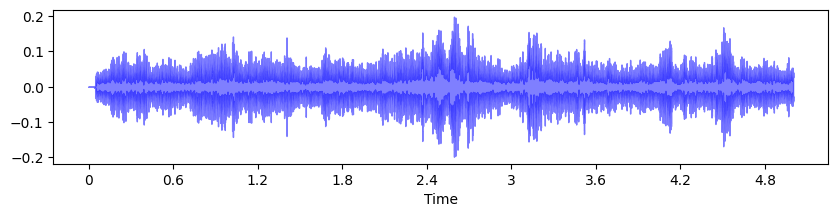

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


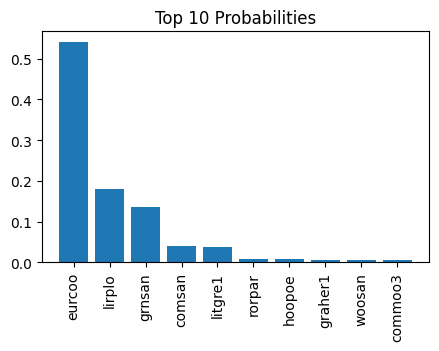

file: ../input/birdclef-2024/train_audio//asbfly/XC647397.ogg


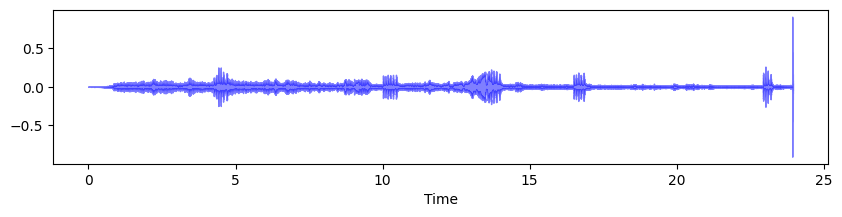

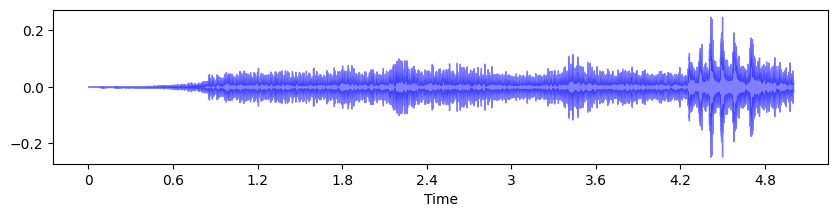

Interval prediction: lirplo, pred_idx: 105, bird_idx: 181


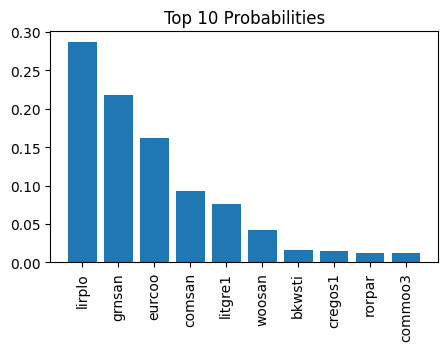

file: ../input/birdclef-2024/train_audio//asbfly/XC665386.ogg


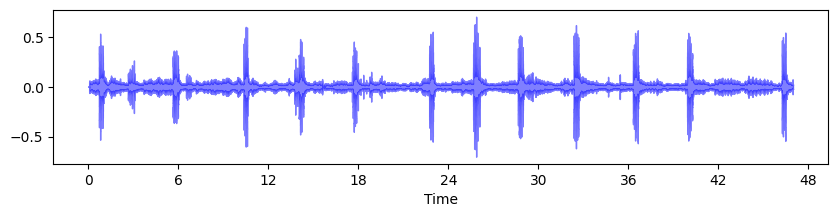

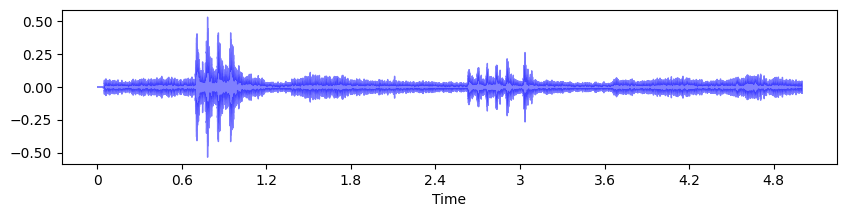

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


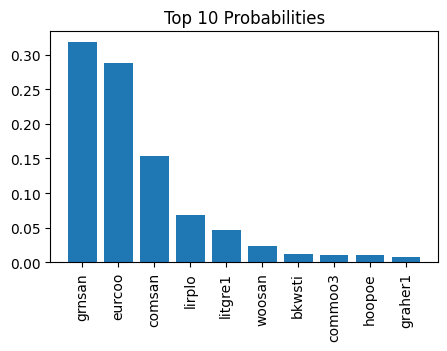

file: ../input/birdclef-2024/train_audio//asbfly/XC677470.ogg


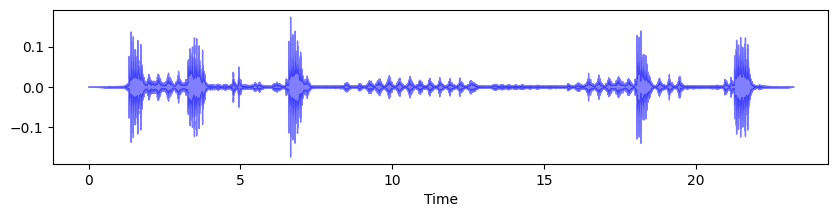

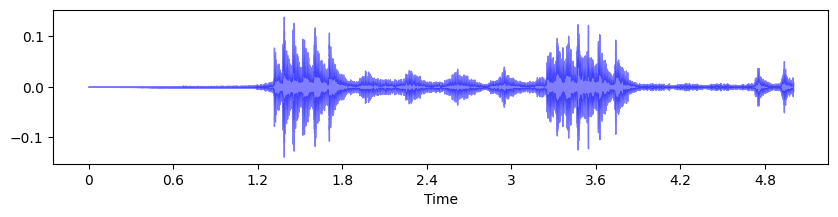

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


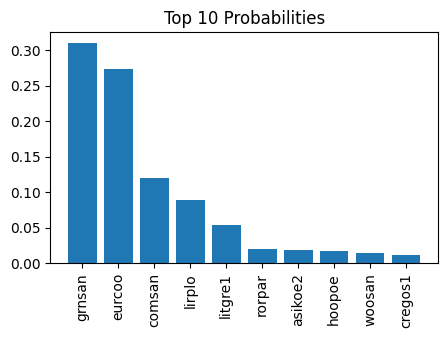

file: ../input/birdclef-2024/train_audio//asbfly/XC684073.ogg


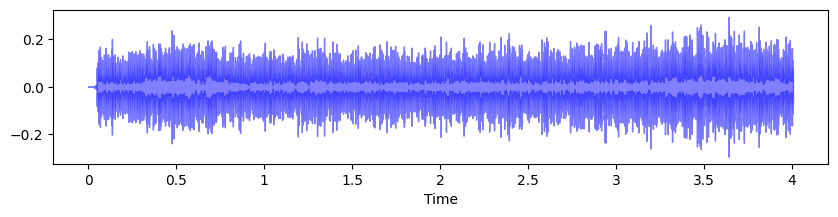

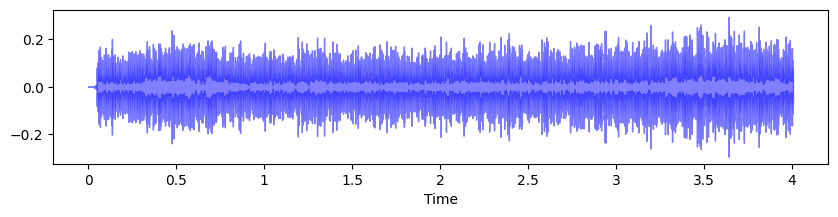

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


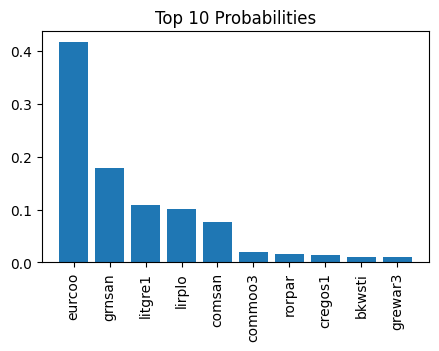

file: ../input/birdclef-2024/train_audio//asbfly/XC687953.ogg


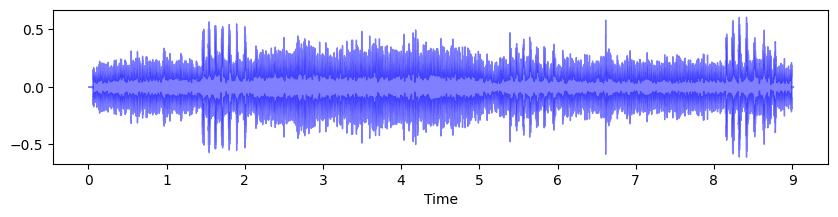

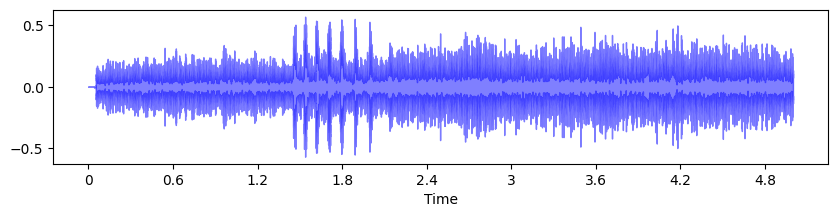

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


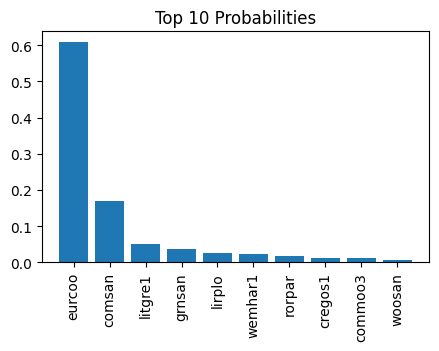

file: ../input/birdclef-2024/train_audio//asbfly/XC687954.ogg


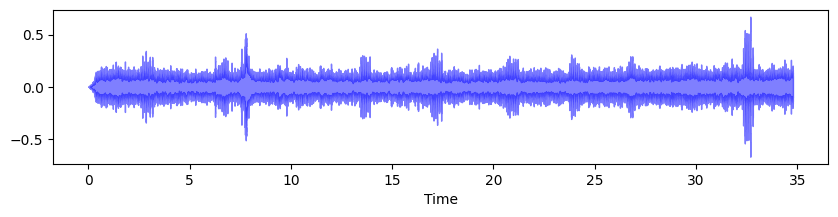

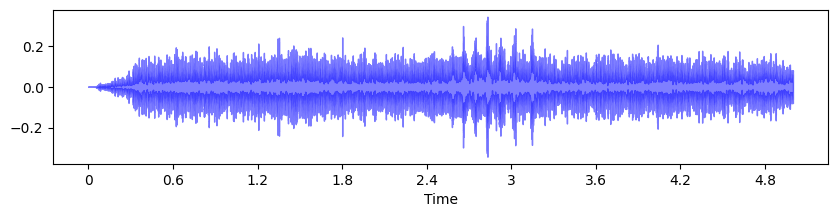

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


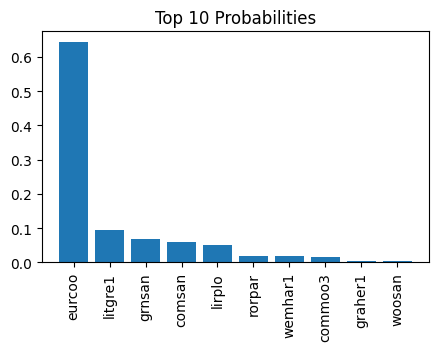

file: ../input/birdclef-2024/train_audio//asbfly/XC687955.ogg


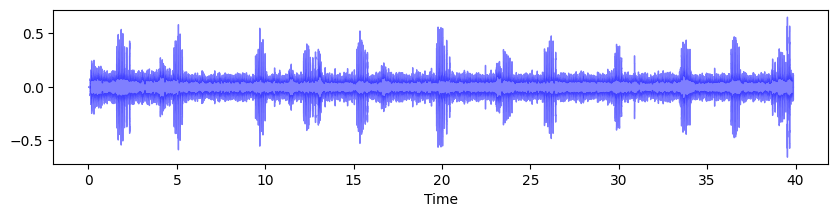

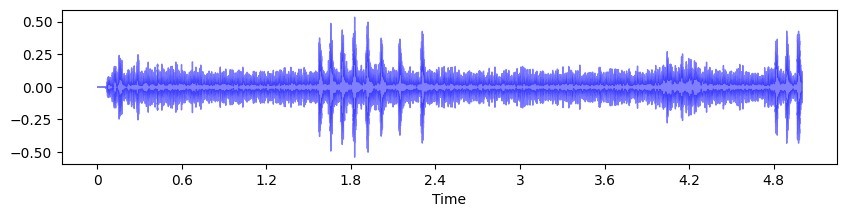

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


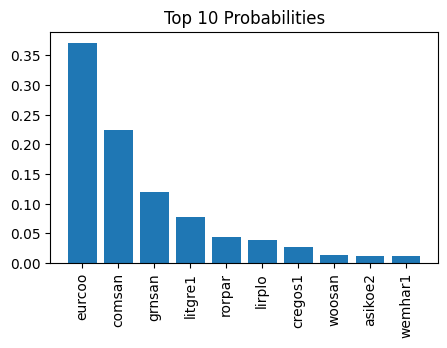

file: ../input/birdclef-2024/train_audio//asbfly/XC712207.ogg


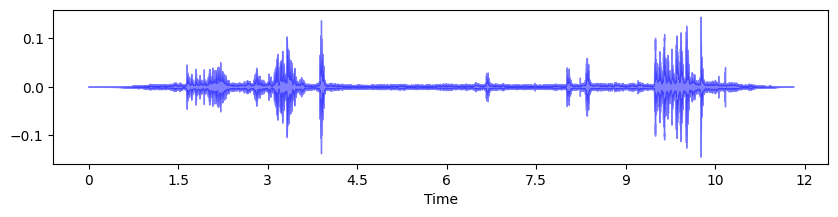

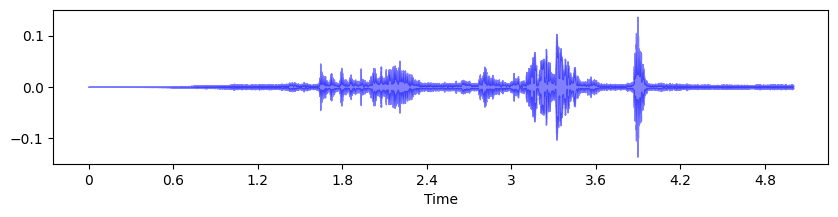

Interval prediction: lirplo, pred_idx: 105, bird_idx: 181


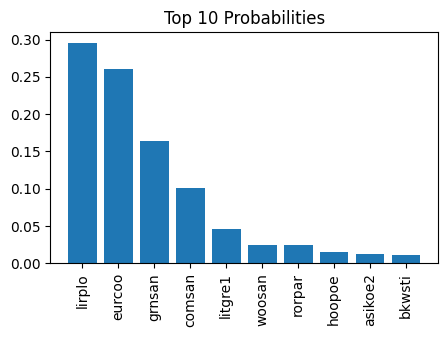

file: ../input/birdclef-2024/train_audio//asbfly/XC713467.ogg


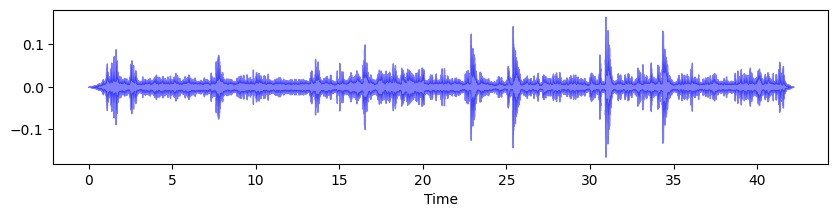

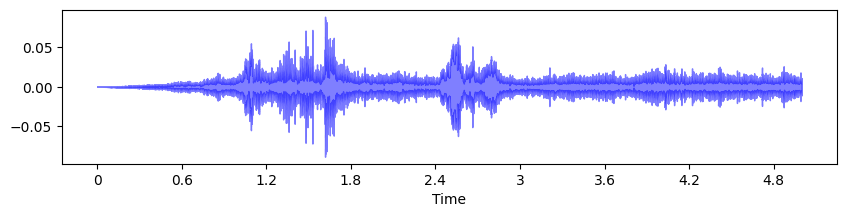

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


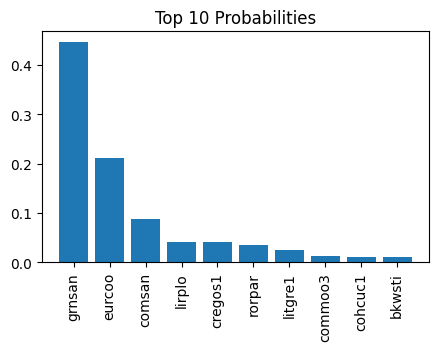

file: ../input/birdclef-2024/train_audio//asbfly/XC713503.ogg


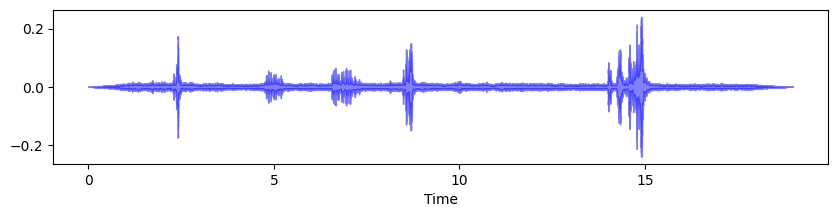

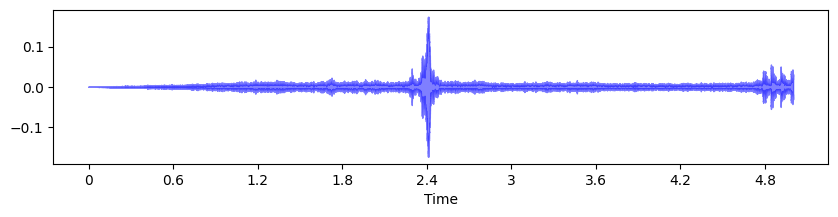

Interval prediction: lirplo, pred_idx: 105, bird_idx: 181


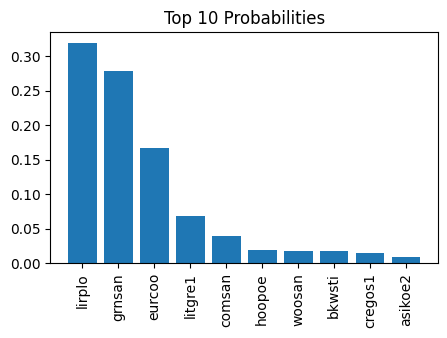

file: ../input/birdclef-2024/train_audio//asbfly/XC716486.ogg


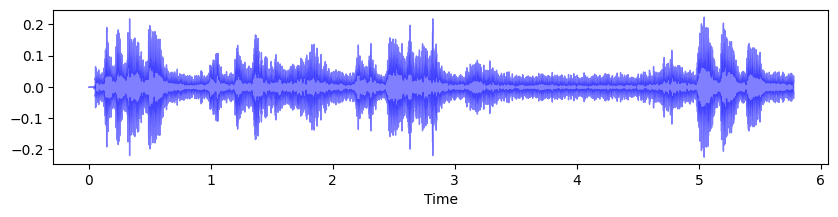

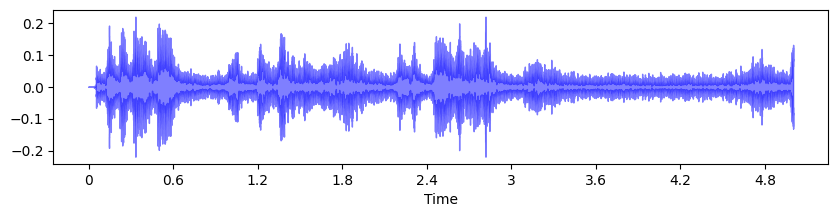

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


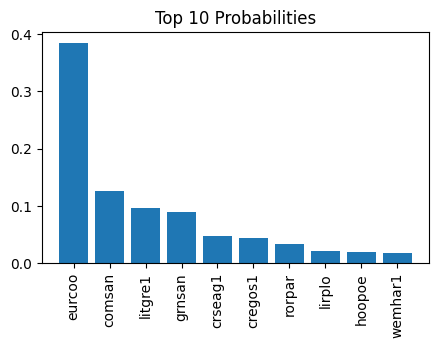

file: ../input/birdclef-2024/train_audio//asbfly/XC716692.ogg


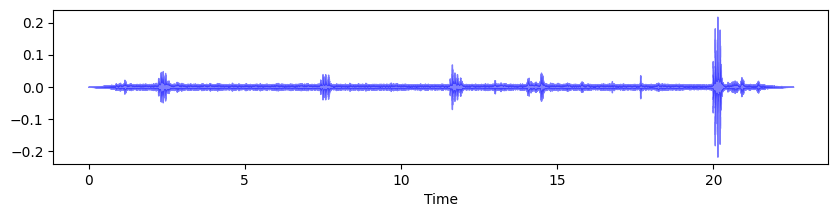

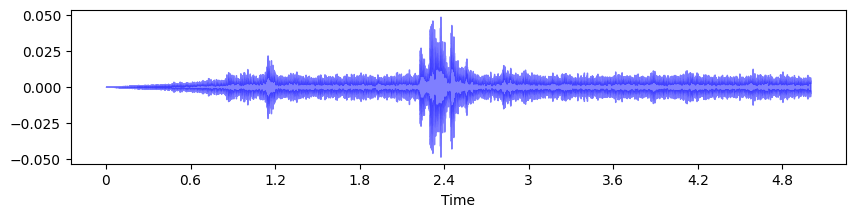

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


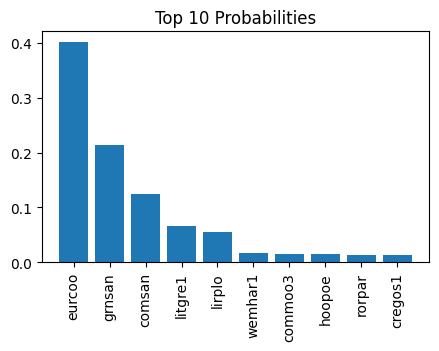

file: ../input/birdclef-2024/train_audio//asbfly/XC716727.ogg


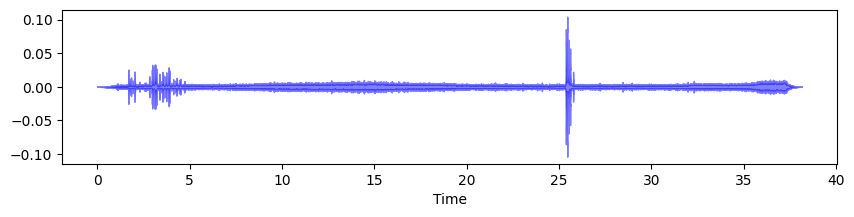

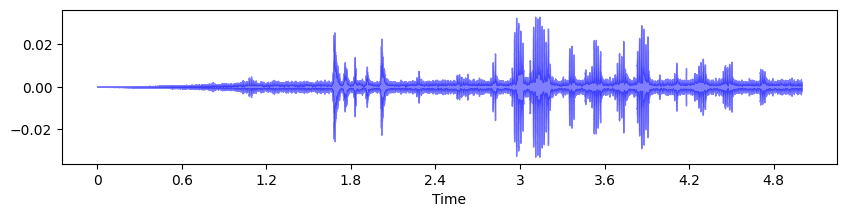

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


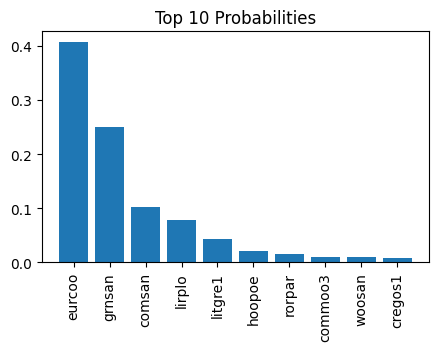

file: ../input/birdclef-2024/train_audio//asbfly/XC716737.ogg


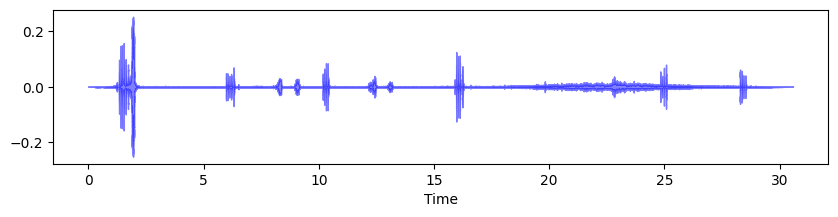

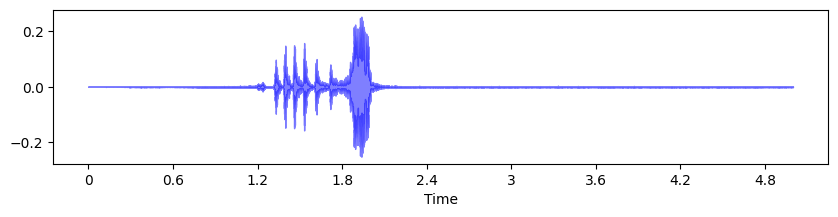

Interval prediction: lirplo, pred_idx: 105, bird_idx: 181


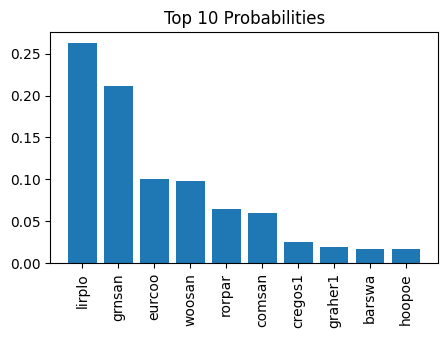

file: ../input/birdclef-2024/train_audio//asbfly/XC716738.ogg


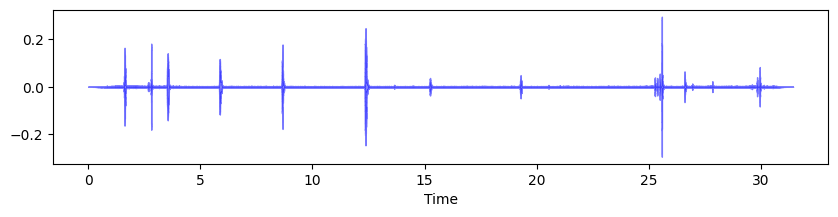

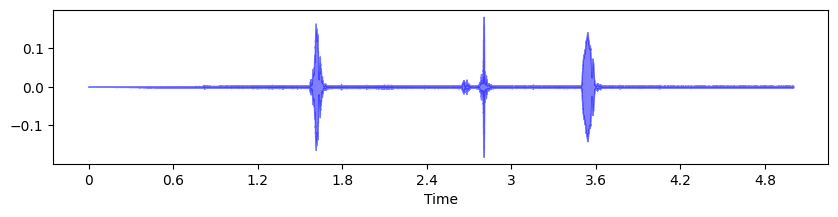

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


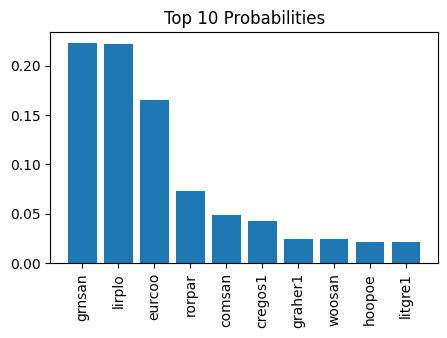

file: ../input/birdclef-2024/train_audio//asbfly/XC716740.ogg


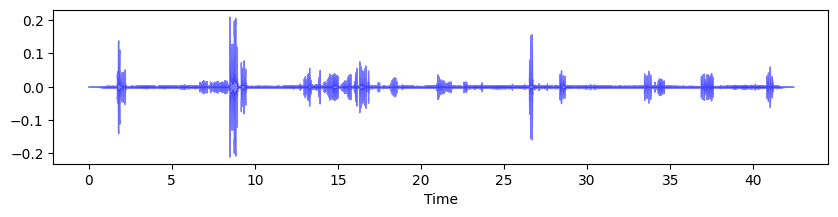

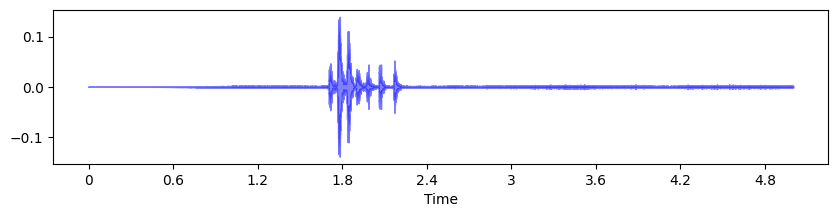

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


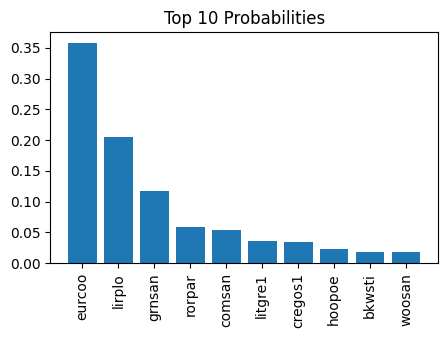

file: ../input/birdclef-2024/train_audio//asbfly/XC718355.ogg


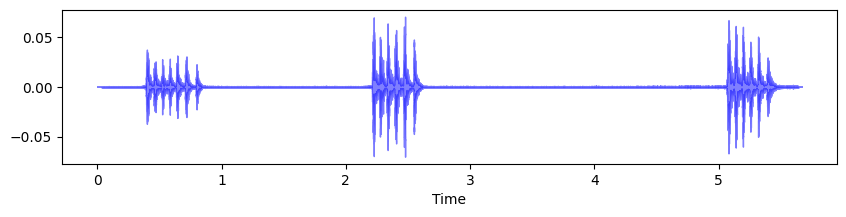

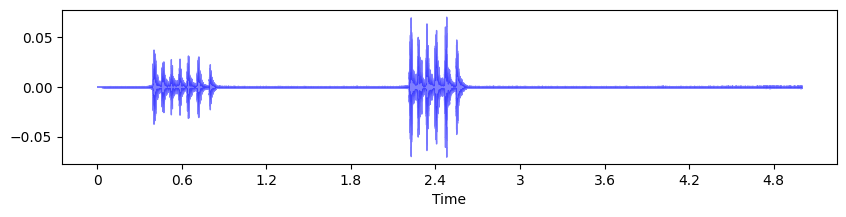

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


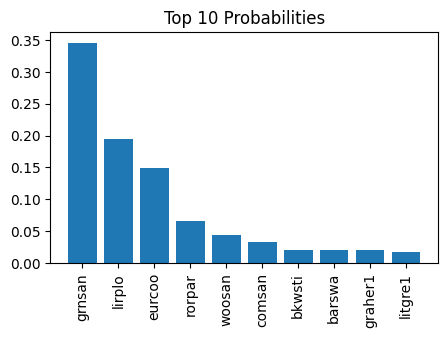

file: ../input/birdclef-2024/train_audio//asbfly/XC724148.ogg


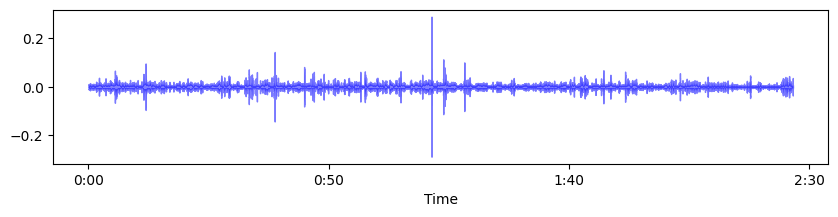

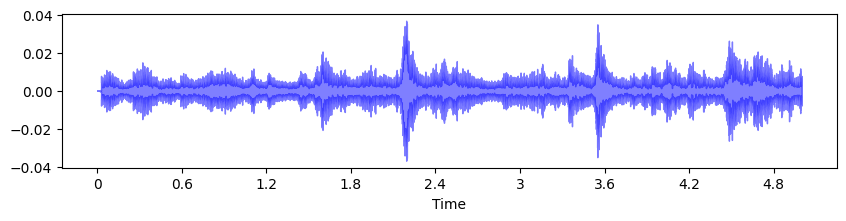

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


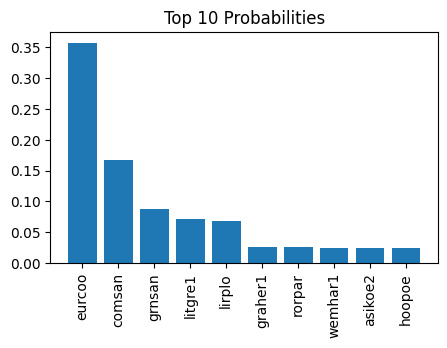

file: ../input/birdclef-2024/train_audio//asbfly/XC724266.ogg


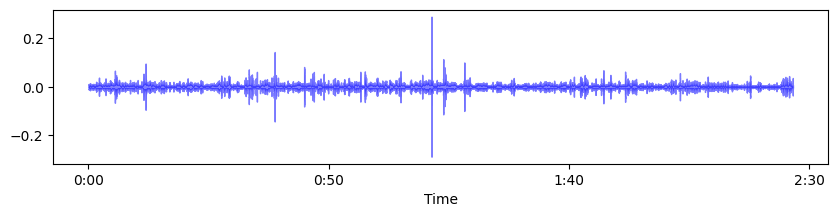

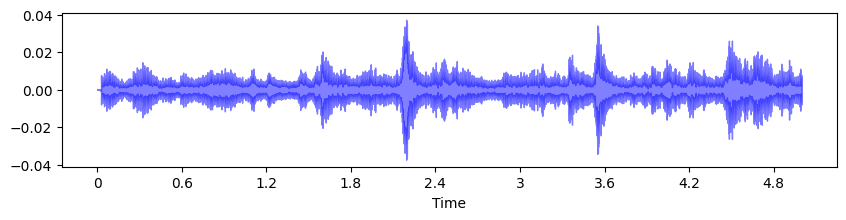

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


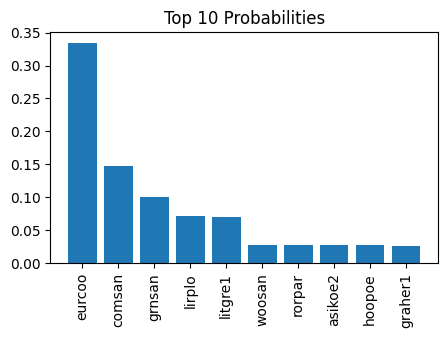

file: ../input/birdclef-2024/train_audio//asbfly/XC741062.ogg


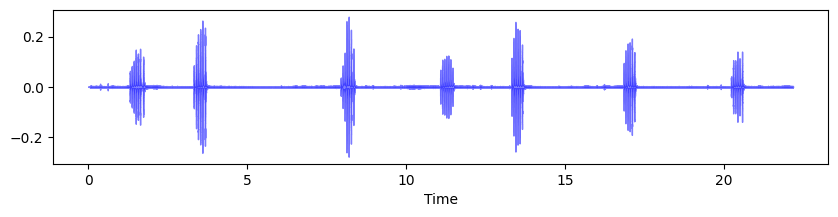

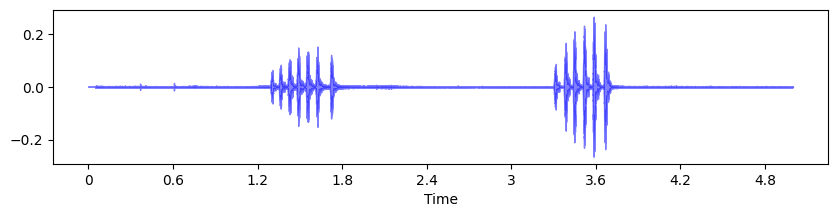

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


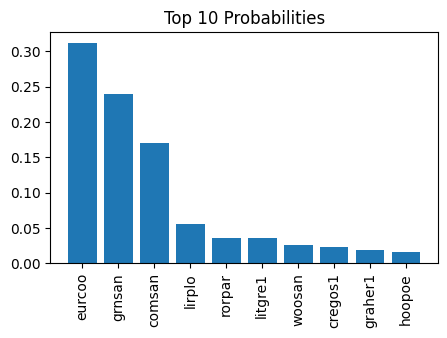

file: ../input/birdclef-2024/train_audio//asbfly/XC741066.ogg


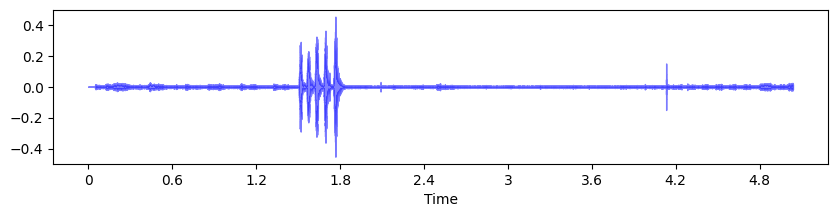

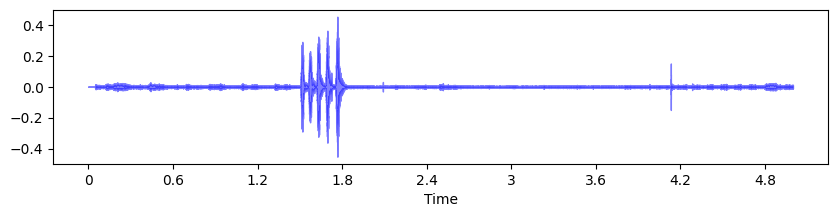

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


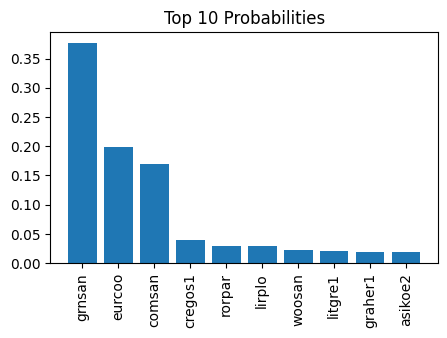

file: ../input/birdclef-2024/train_audio//asbfly/XC741067.ogg


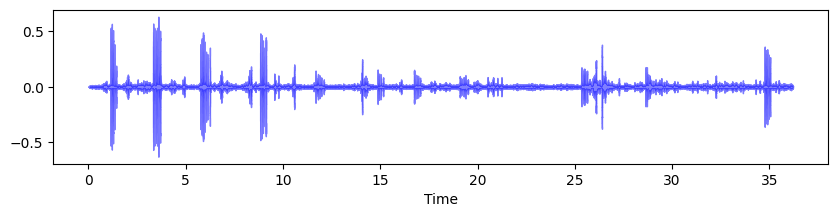

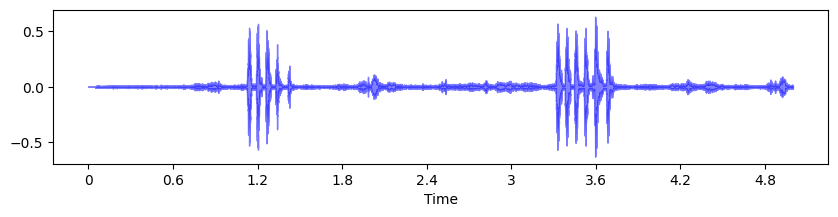

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


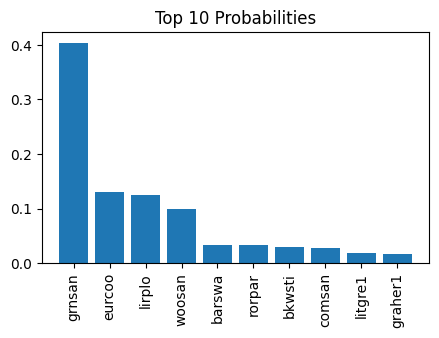

file: ../input/birdclef-2024/train_audio//asbfly/XC745831.ogg


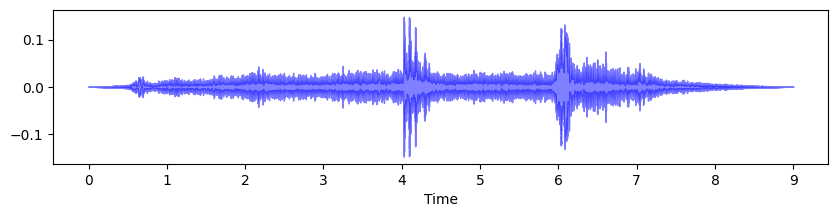

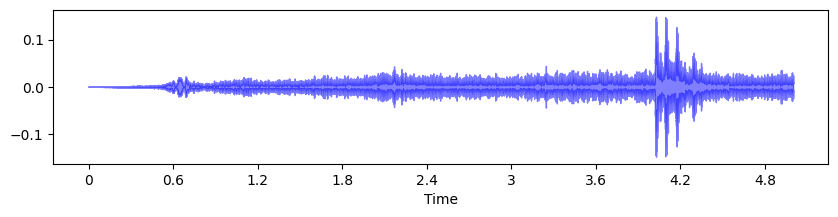

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


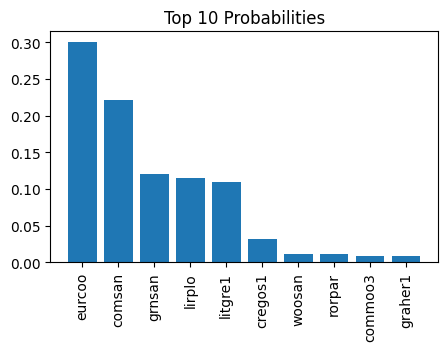

file: ../input/birdclef-2024/train_audio//asbfly/XC749597.ogg


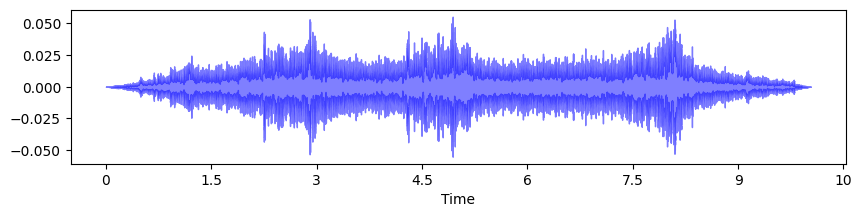

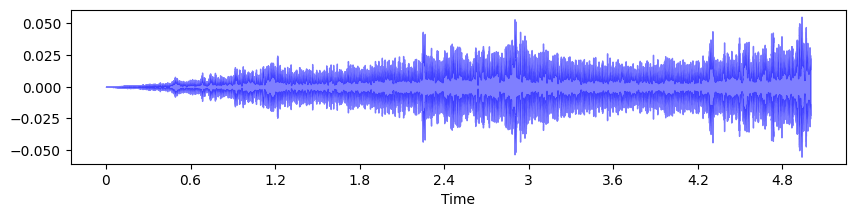

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


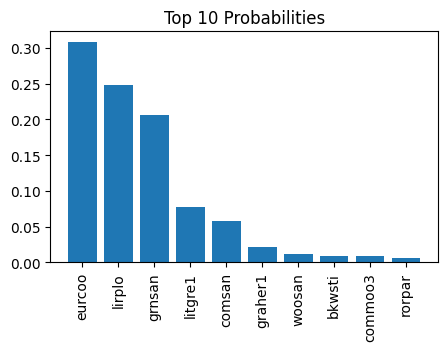

file: ../input/birdclef-2024/train_audio//asbfly/XC756431.ogg


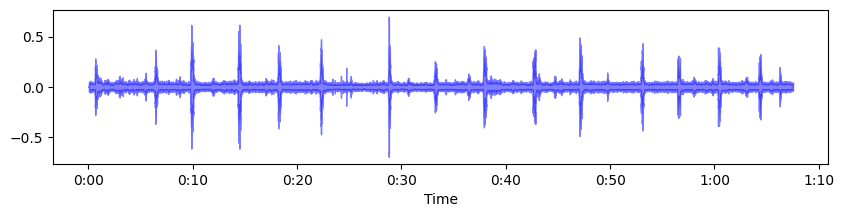

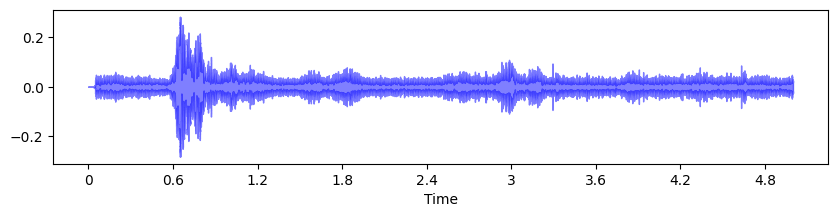

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


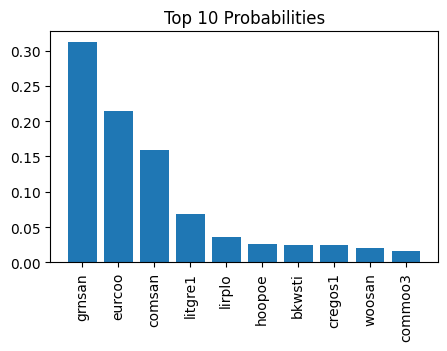

file: ../input/birdclef-2024/train_audio//asbfly/XC756532.ogg


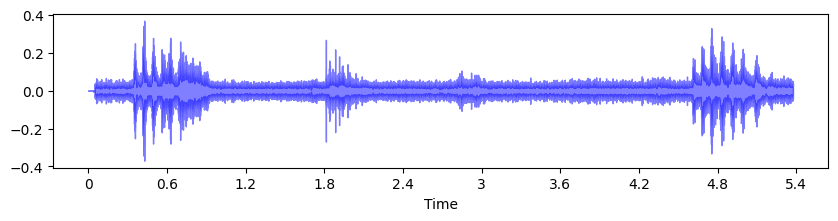

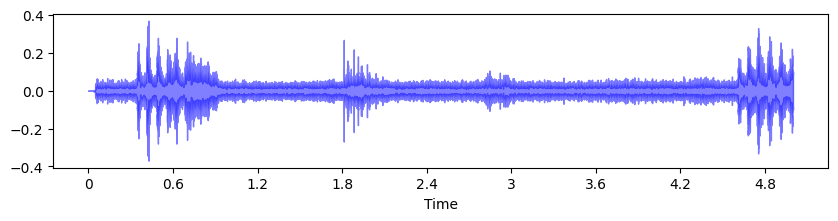

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


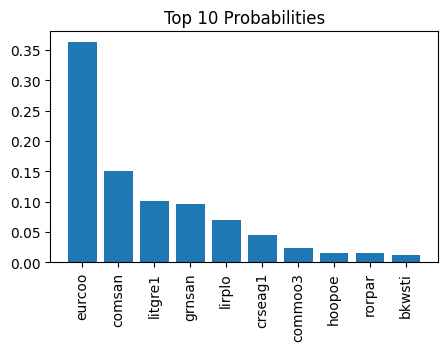

file: ../input/birdclef-2024/train_audio//asbfly/XC756617.ogg


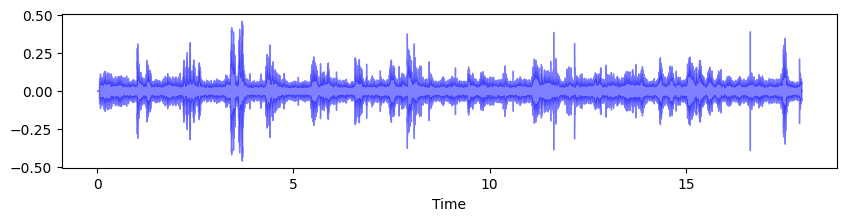

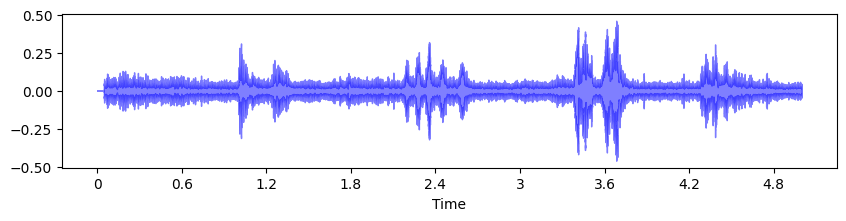

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


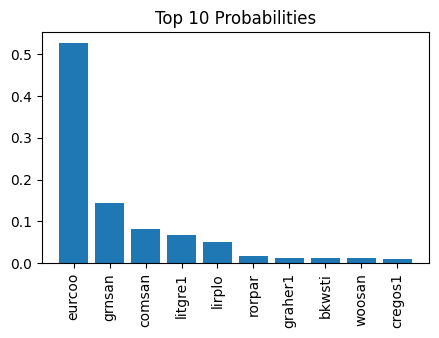

file: ../input/birdclef-2024/train_audio//asbfly/XC760532.ogg


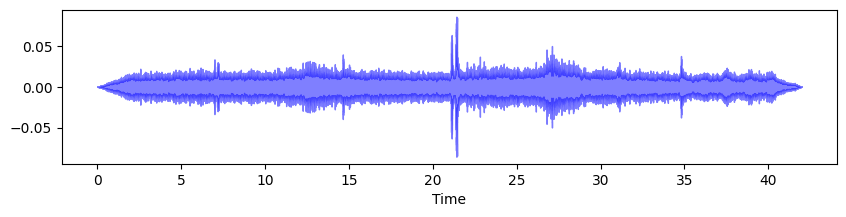

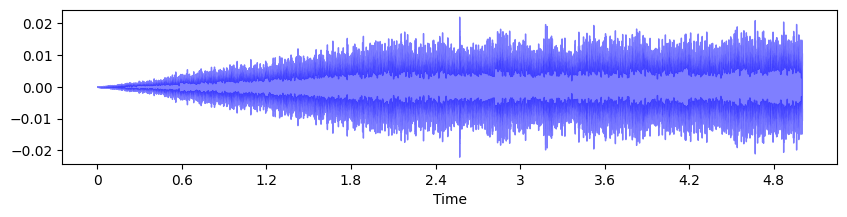

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


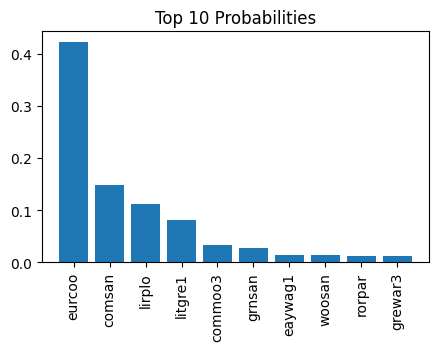

file: ../input/birdclef-2024/train_audio//asbfly/XC767510.ogg


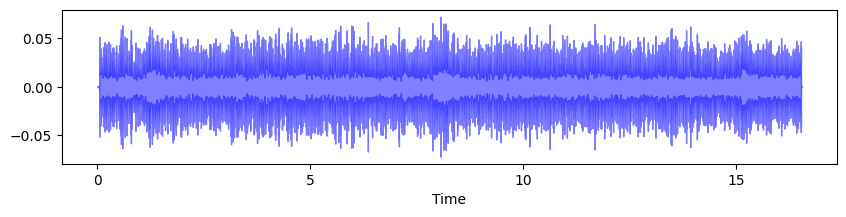

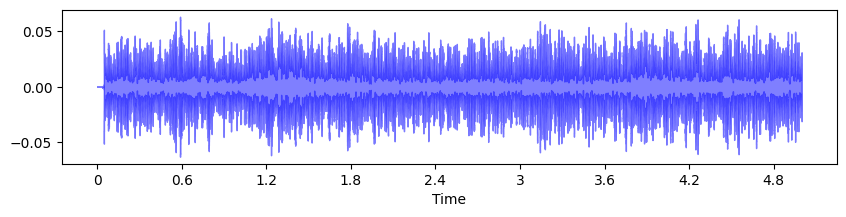

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


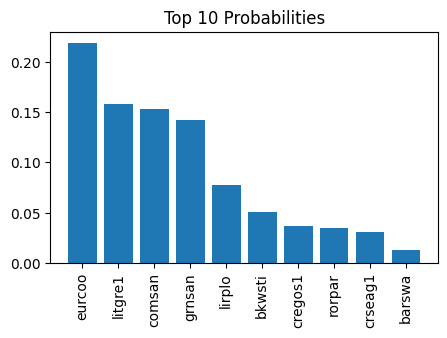

file: ../input/birdclef-2024/train_audio//asbfly/XC770506.ogg


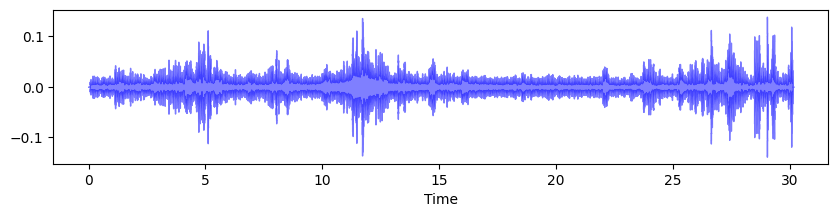

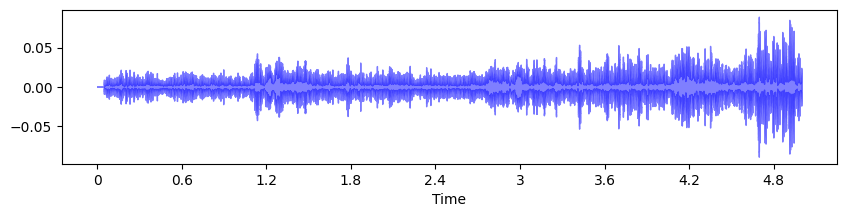

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


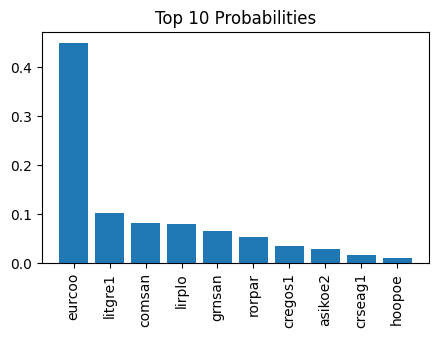

file: ../input/birdclef-2024/train_audio//asbfly/XC770507.ogg


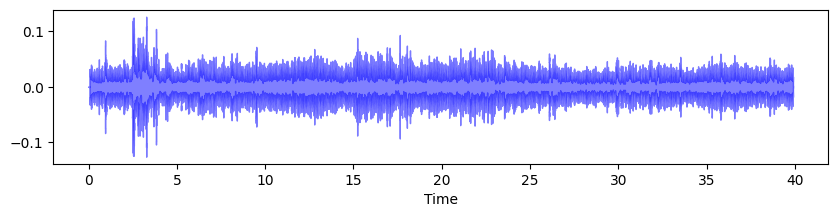

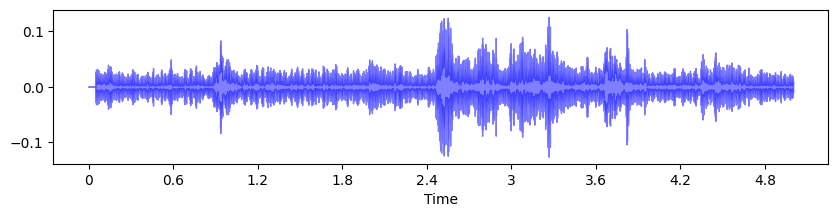

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


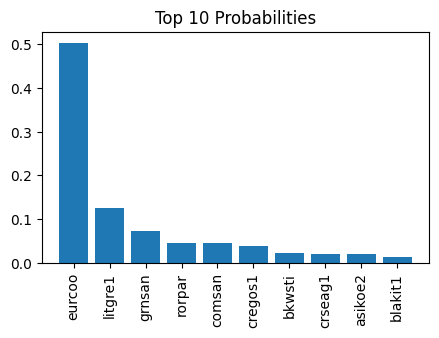

file: ../input/birdclef-2024/train_audio//asbfly/XC775904.ogg


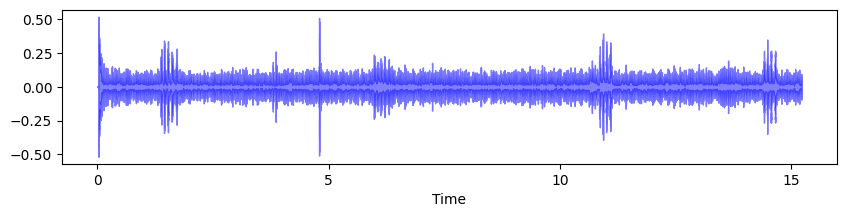

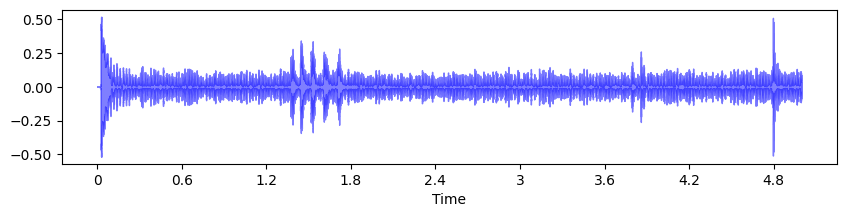

Interval prediction: lirplo, pred_idx: 105, bird_idx: 181


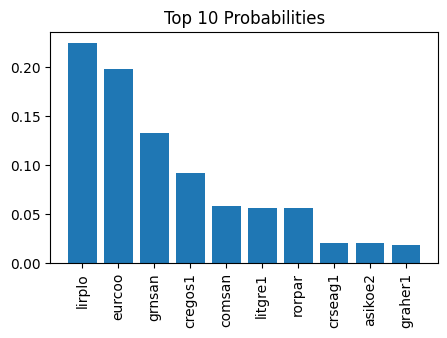

file: ../input/birdclef-2024/train_audio//asbfly/XC778686.ogg


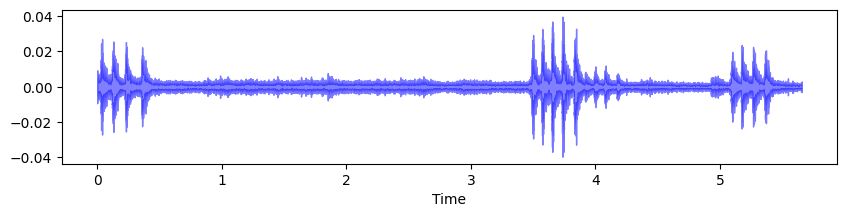

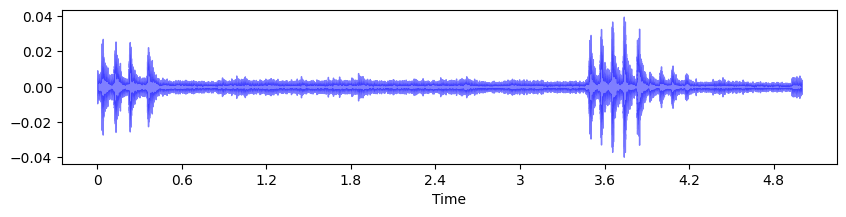

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


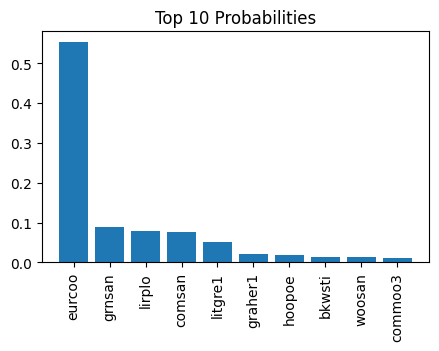

file: ../input/birdclef-2024/train_audio//asbfly/XC778717.ogg


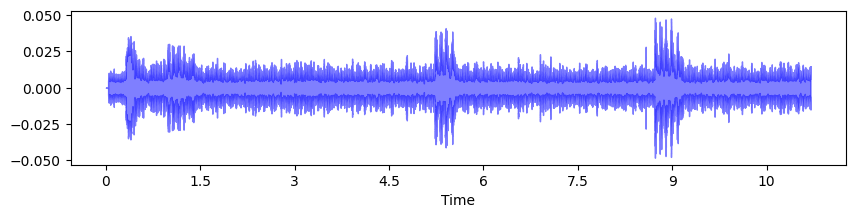

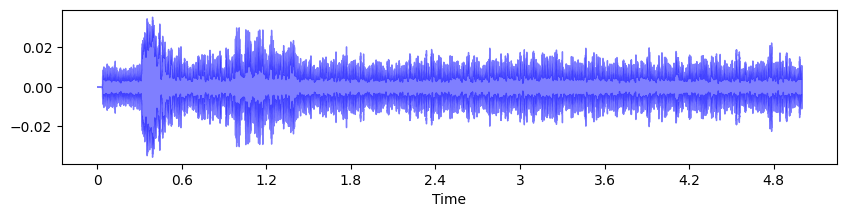

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


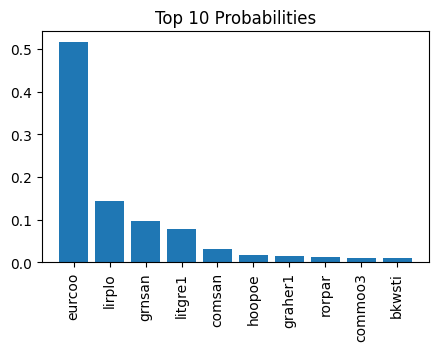

file: ../input/birdclef-2024/train_audio//asbfly/XC785503.ogg


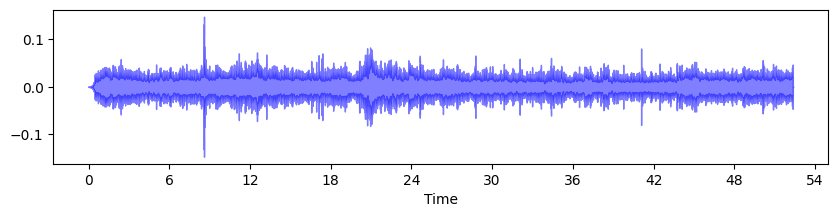

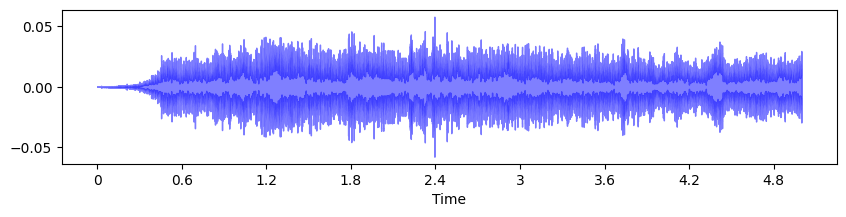

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


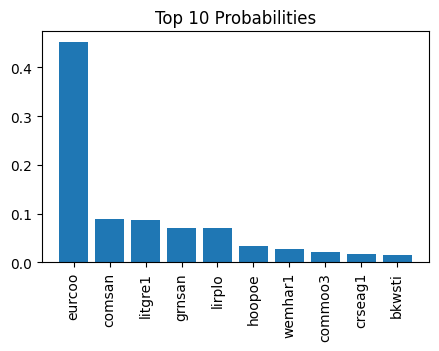

file: ../input/birdclef-2024/train_audio//asbfly/XC805713.ogg


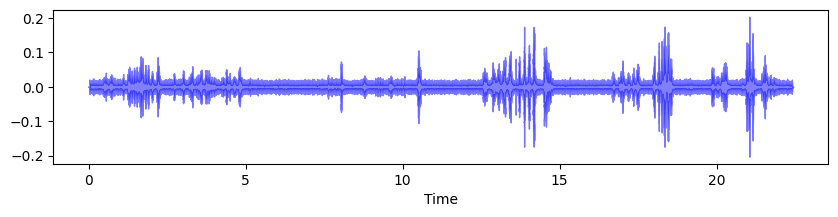

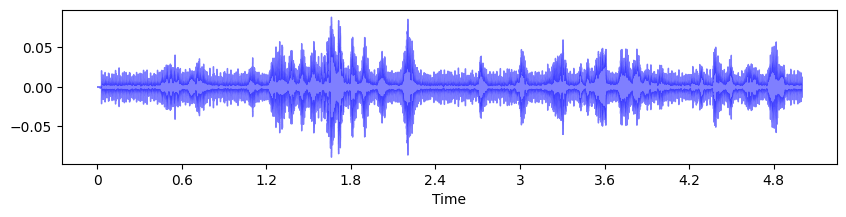

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


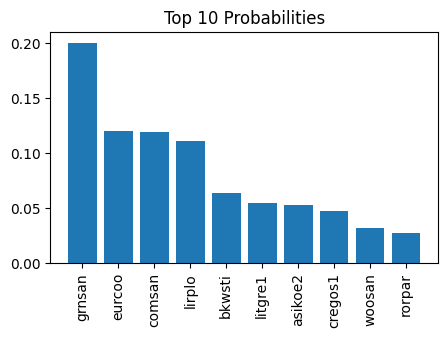

file: ../input/birdclef-2024/train_audio//asbfly/XC818340.ogg


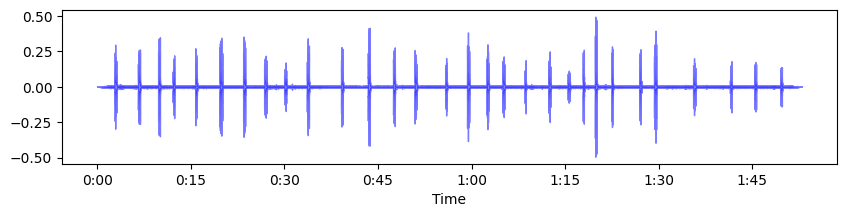

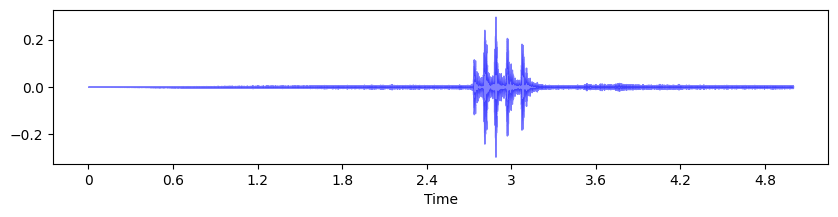

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


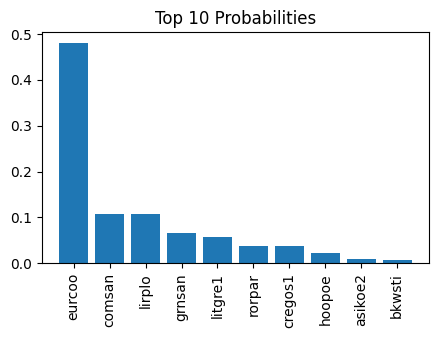

file: ../input/birdclef-2024/train_audio//asbfly/XC821324.ogg


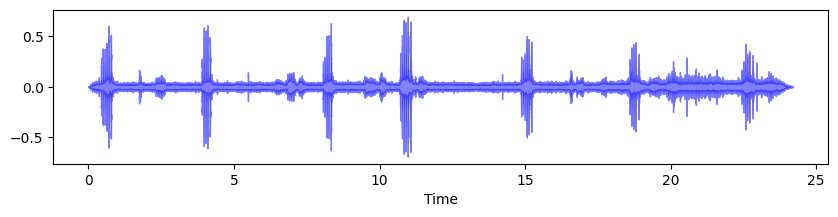

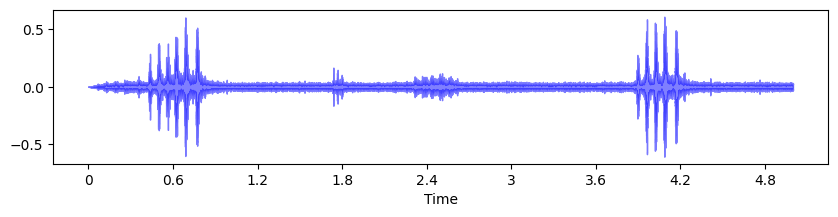

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


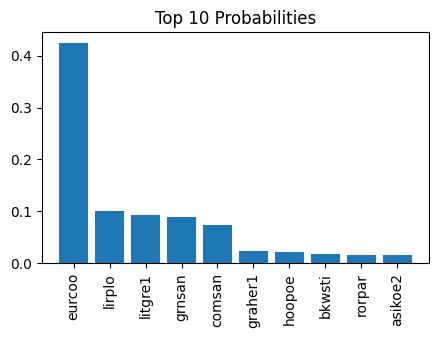

file: ../input/birdclef-2024/train_audio//asbfly/XC821773.ogg


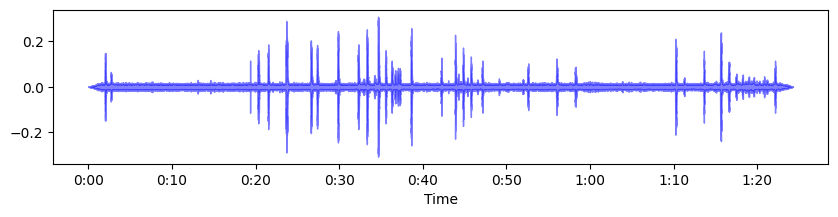

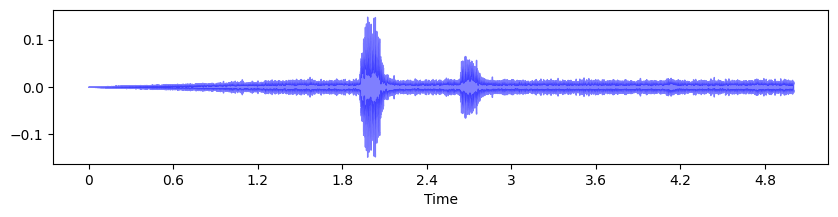

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


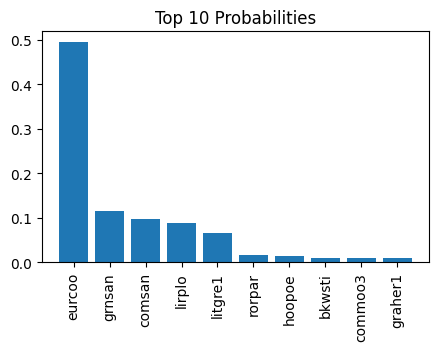

file: ../input/birdclef-2024/train_audio//asbfly/XC825177.ogg


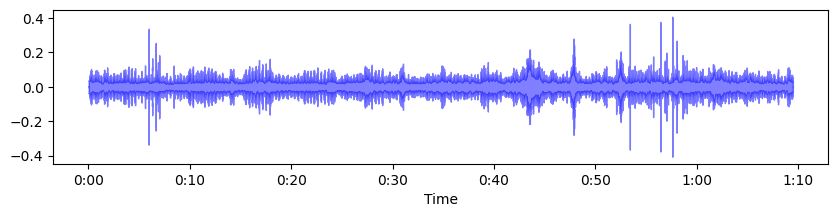

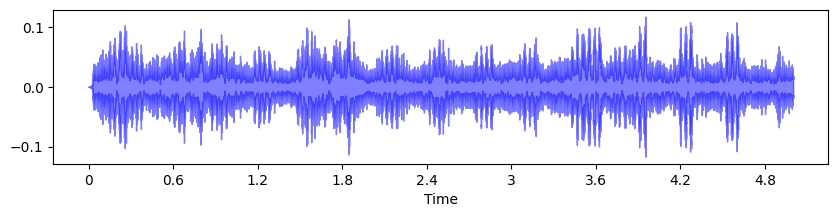

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


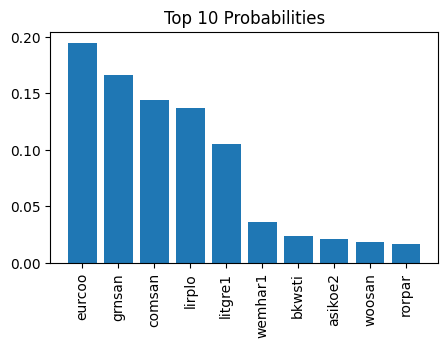

file: ../input/birdclef-2024/train_audio//asbfly/XC827640.ogg


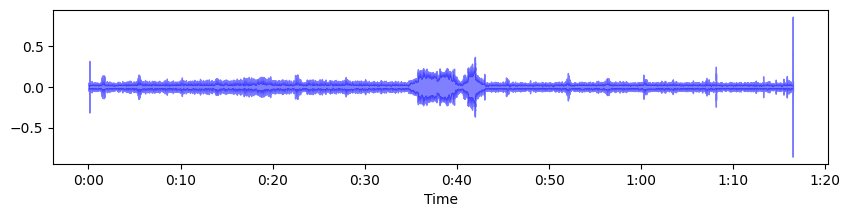

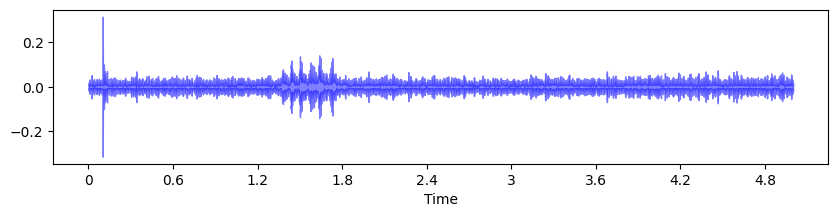

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


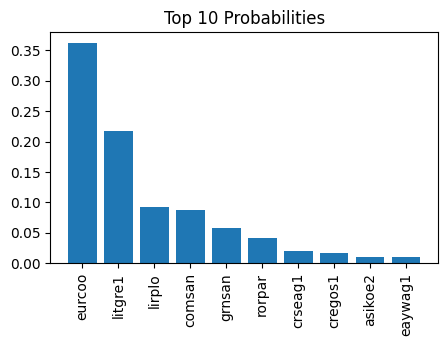

file: ../input/birdclef-2024/train_audio//asbfly/XC830258.ogg


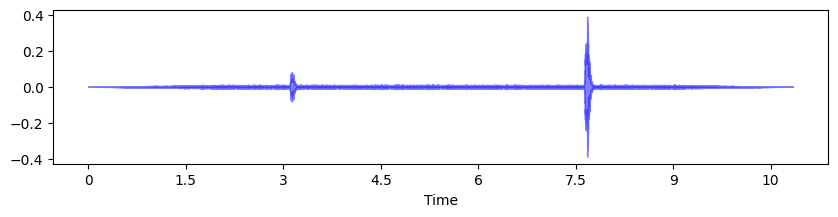

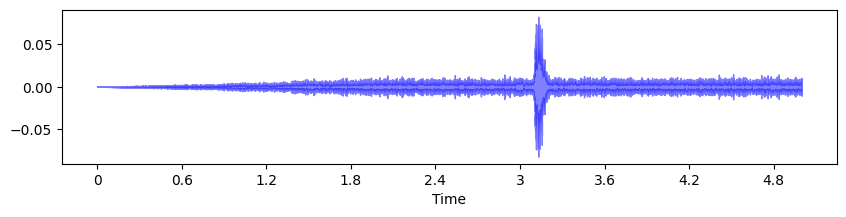

Interval prediction: lirplo, pred_idx: 105, bird_idx: 181


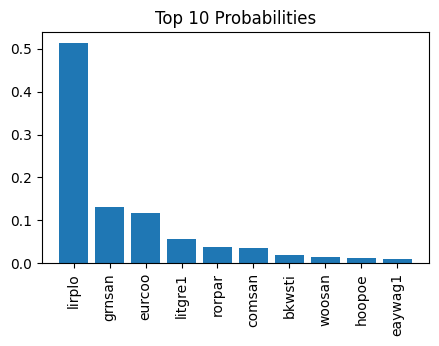

file: ../input/birdclef-2024/train_audio//asbfly/XC833987.ogg


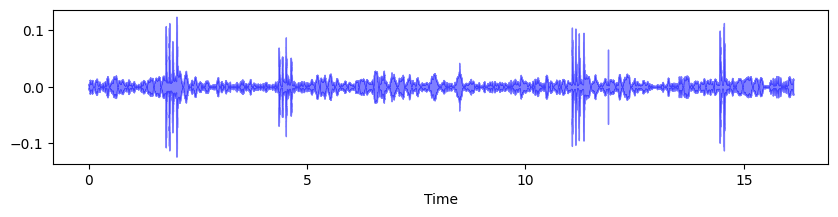

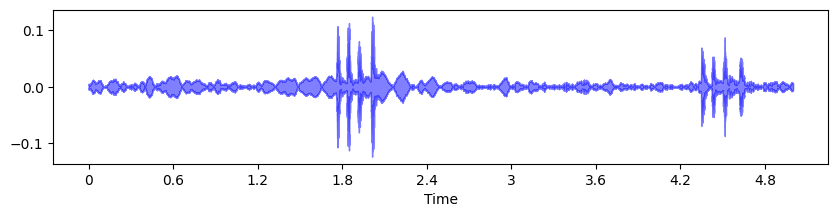

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


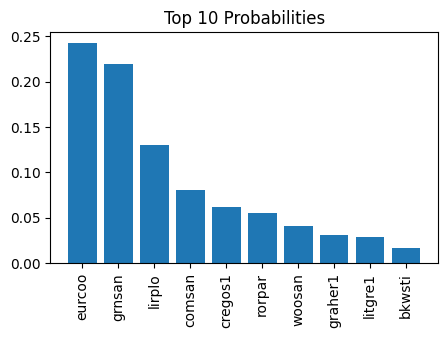

file: ../input/birdclef-2024/train_audio//asbfly/XC834959.ogg


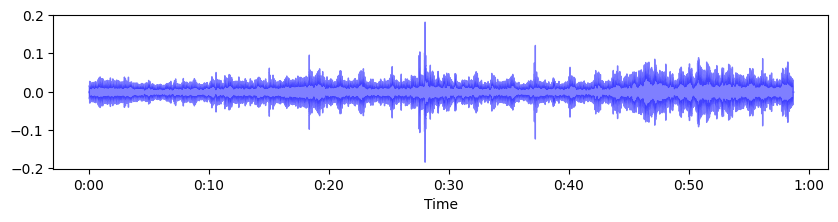

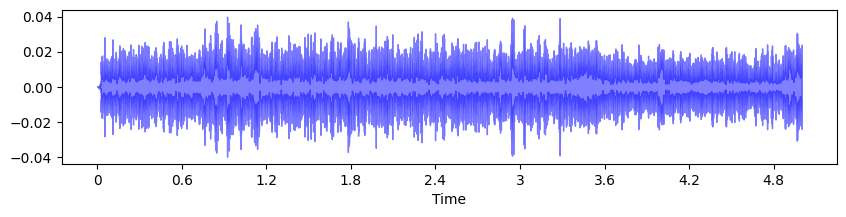

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


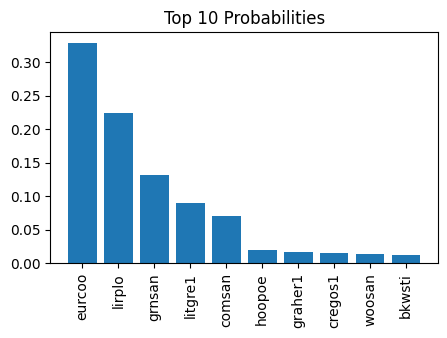

file: ../input/birdclef-2024/train_audio//asbfly/XC837545.ogg


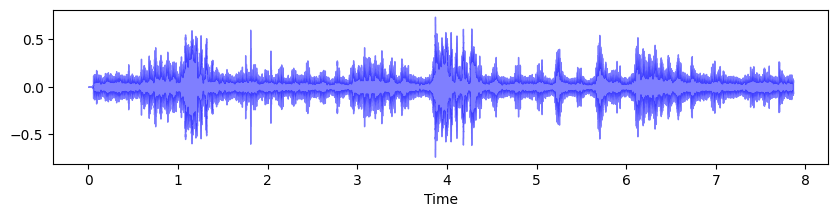

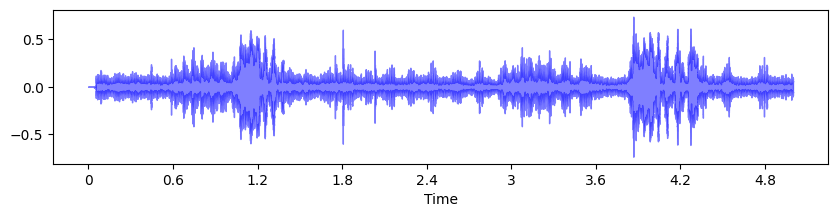

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


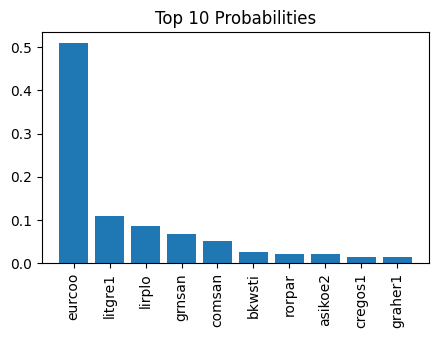

file: ../input/birdclef-2024/train_audio//asbfly/XC839572.ogg


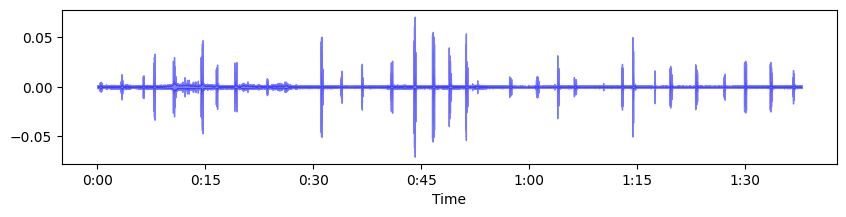

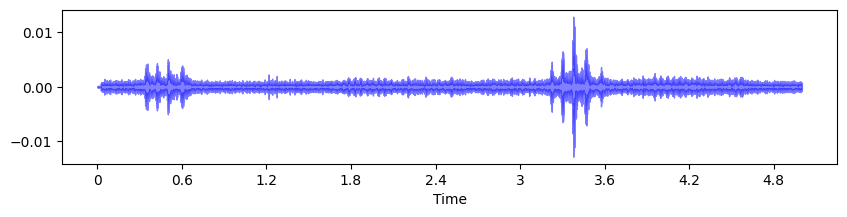

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


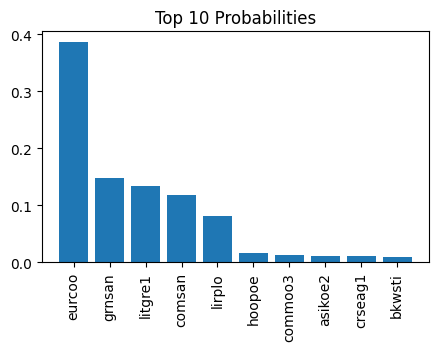

file: ../input/birdclef-2024/train_audio//asbfly/XC842684.ogg


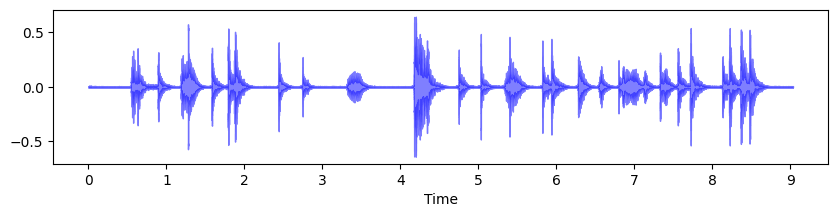

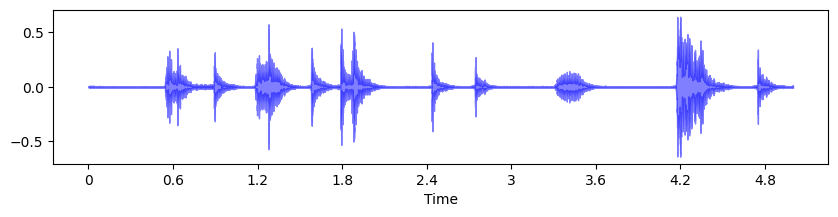

Interval prediction: grnsan, pred_idx: 71, bird_idx: 181


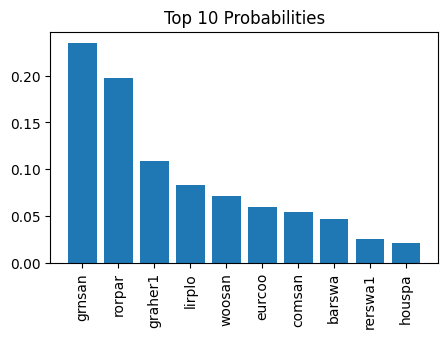

file: ../input/birdclef-2024/train_audio//asbfly/XC842686.ogg


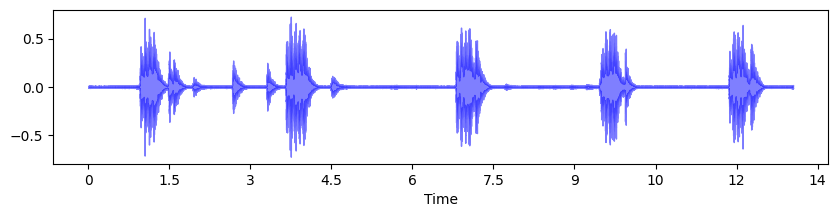

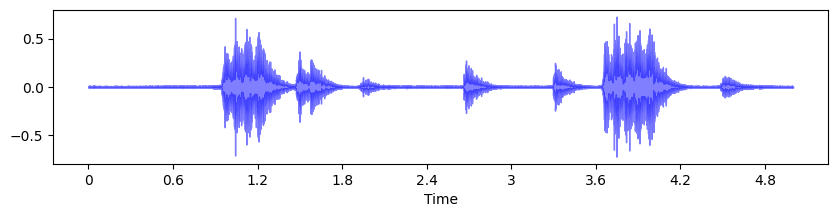

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


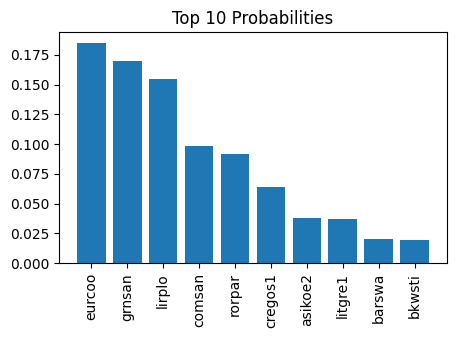

file: ../input/birdclef-2024/train_audio//asbfly/XC846616.ogg


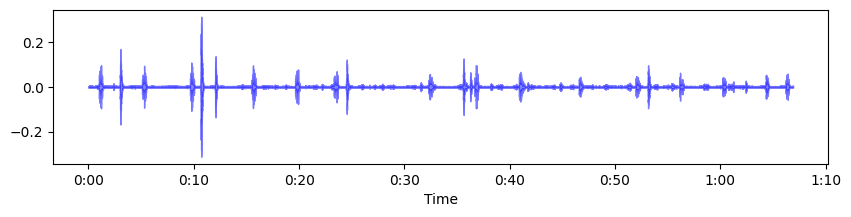

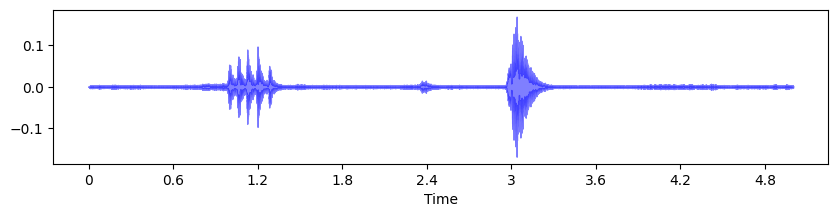

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


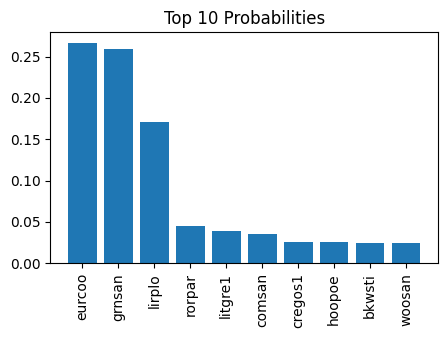

file: ../input/birdclef-2024/train_audio//asbfly/XC856776.ogg


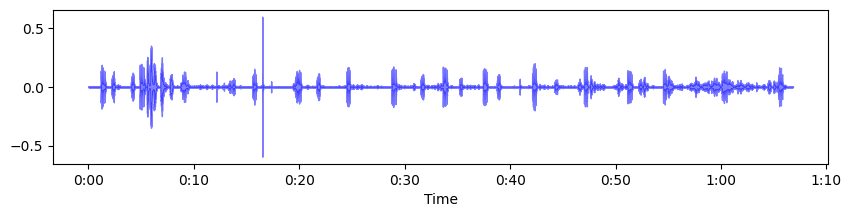

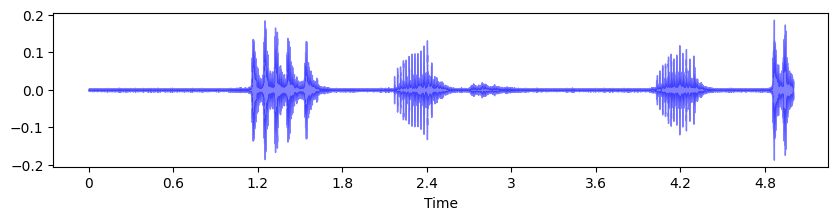

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


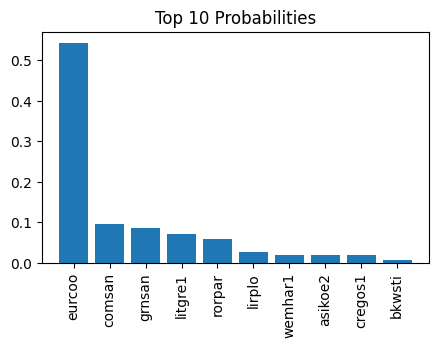

file: ../input/birdclef-2024/train_audio//asbfly/XC858110.ogg


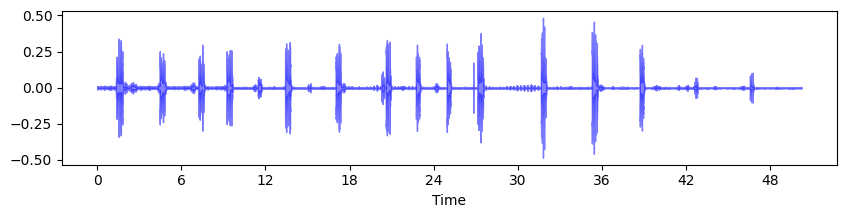

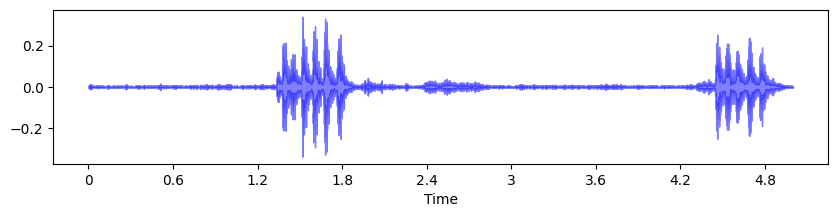

Interval prediction: eurcoo, pred_idx: 57, bird_idx: 181


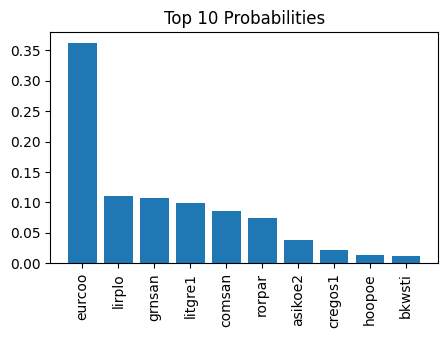

In [44]:
all_preds = []

# store results here
pred = {'row_id': []}

interval_length = 5
threshold_mult = .1
empty = False

species_list = sorted(os.listdir(train_audio_dir))
for species_code in species_list:
    pred[species_code] = []

# Loop through audio files, process and make predictions
for afile in tqdm(file_list):
    
    # Complete file path
    #path = test_audio_dir + afile + '.ogg'
    path = train_audio_dir + '/asbfly/' + afile
    print(f'file: {path}')
    
    # Open file with librosa and split signal into 5-second chunks
    y,sr = librosa.load(path, sr=None)
    plt.figure(figsize=(10,2))
    librosa.display.waveshow(y, sr=sr,color="blue",alpha=0.5)
    plt.show()
    
    # get the max and min of the whole audio file
    max_y = np.max(y)
    min_y = np.min(y)
    range_y = max_y - min_y
    
    # get the number of samples in each interval
    samples_per_interval = int(interval_length * sr)
    
    # The documentation states that all files are 4 minutes, so we have 4min / 5s == 48 segments.
    chunks = [[] for i in range(1)]
    
    # Make prediction for each chunk
    for i in range(len(chunks)):        
        chunk_end_time = (i + 1) * 5
        
        # Assign the row_id which we need to do for each chunk
        row_id = afile + '_' + str(chunk_end_time)
        pred['row_id'].append(row_id)
        
        # get the start and end samples for the interval
        start_sample = i * samples_per_interval
        end_sample = (i + 1) * samples_per_interval
        
        # get the interval audio
        y_interval = y[start_sample:end_sample]
        plt.figure(figsize=(10,2))
        librosa.display.waveshow(y_interval, sr=sr,color="blue",alpha=0.5)
        plt.show()
        
        # get the max and min of the interval
        max_y_interval = np.max(y_interval)
        min_y_interval = np.min(y_interval)
        range_y_interval = max_y_interval - min_y_interval
        
        # get the interval spectrogram and resize to 192x192 for resnet 18
        im = librosa.amplitude_to_db(np.abs(librosa.stft(y_interval)), ref=np.max) # maybe want an absolute here
        im = cv2.resize(im, (192, 192))
#         plt.figure()
#         plt.imshow(im)
#         plt.show()
        
        # make predictions on this spectrogram
        with learn_inf.no_bar(), learn_inf.no_logging():
            prediction,pred_idx,probs = learn_inf.predict(im)
        
        print(f'Interval prediction: {prediction}, pred_idx: {pred_idx}, bird_idx: {bird_idx}')
        all_preds.append(prediction)
        
        top10 = list(np.argsort(probs)[-10:])
        #top10 = top10[::-1]
        
        plt.figure(figsize=(5,3))
        plt.bar([learn_labels[i] for i in top10[::-1]], [probs[i] for i in top10][::-1])
        plt.xticks(rotation=90)
        plt.title('Top 10 Probabilities')
        plt.show()
        
        for bird in species_list:
            
            if range_y_interval < threshold_mult * range_y:
    
                pred[bird].append(0.0)
            
            else:
 
                bird_idx = learn_labels.index(bird)  # get index of this bird
                #print(f'Probability of {bird} = {probs[bird_idx]}')
                pred[bird].append(probs[bird_idx])

            

In [26]:
probs

tensor([9.8586e-07, 2.4017e-05, 9.4517e-06, 4.2115e-08, 8.0200e-03, 2.5075e-06,
        7.1350e-07, 9.8293e-06, 6.0193e-06, 5.8123e-03, 4.5304e-04, 1.2564e-07,
        1.3625e-06, 1.3387e-06, 8.7631e-03, 2.9697e-07, 8.7397e-05, 4.8962e-03,
        5.8343e-05, 4.0533e-06, 5.4930e-06, 8.9668e-07, 1.8671e-07, 1.3171e-06,
        2.7469e-07, 6.3060e-05, 2.5557e-06, 8.3228e-05, 1.8813e-04, 3.3850e-06,
        2.9145e-05, 2.4329e-07, 2.9556e-06, 3.7052e-05, 1.2760e-06, 1.7056e-03,
        1.2881e-07, 4.3066e-04, 6.8110e-07, 3.4203e-04, 2.0815e-02, 5.2981e-07,
        1.7319e-05, 1.2116e-04, 1.0134e-01, 1.7517e-06, 3.7240e-06, 3.1824e-06,
        1.1481e-02, 2.4576e-06, 2.8571e-03, 2.0274e-06, 1.6649e-06, 1.5013e-03,
        7.4220e-05, 9.5291e-04, 5.0361e-08, 4.2203e-01, 3.8970e-06, 5.7788e-05,
        3.1152e-06, 7.0159e-08, 2.1304e-02, 2.1764e-07, 1.3002e-06, 9.1735e-05,
        9.2950e-06, 8.5315e-06, 1.2935e-05, 2.9400e-05, 3.7061e-03, 1.4811e-01,
        1.1749e-03, 2.5828e-04, 3.6965e-

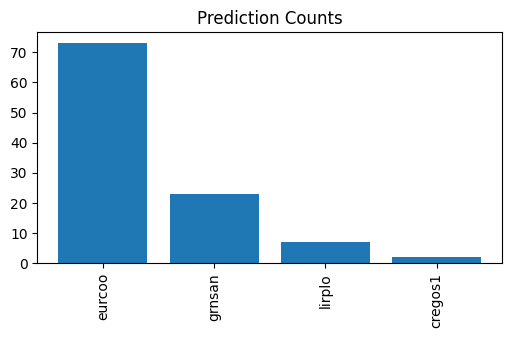

In [49]:
pred_counts = pd.Series(all_preds).value_counts()
plt.figure(figsize=(6,3))
plt.bar(pred_counts.index, pred_counts.values)
plt.xticks(rotation=90)
plt.title('Prediction Counts')
plt.show()

In [41]:
# Make a new data frame and look at some results        
results = pd.DataFrame(pred, columns = ['row_id'] + species_list)
results.head()

,row_id,asbfly,ashdro1,ashpri1,ashwoo2,asikoe2,asiope1,aspfly1,aspswi1,barfly1,...,whbwoo2,whcbar1,whiter2,whrmun,whtkin2,woosan,wynlau1,yebbab1,yebbul3,zitcis1
0,XC134896.ogg_5,tensor(2.8985e-05),tensor(0.0002),tensor(1.4290e-05),tensor(6.7593e-07),tensor(0.0252),tensor(9.7719e-06),tensor(5.8644e-06),tensor(0.0001),tensor(3.3781e-05),...,tensor(0.0005),tensor(4.1738e-05),tensor(3.1190e-05),tensor(2.0745e-06),tensor(3.0269e-07),tensor(0.0112),tensor(0.0001),tensor(7.2364e-05),tensor(2.7156e-05),tensor(0.0002)
1,XC164848.ogg_5,tensor(2.7777e-05),tensor(0.0002),tensor(2.4971e-05),tensor(2.5561e-06),tensor(0.0199),tensor(3.9073e-06),tensor(3.3366e-06),tensor(6.7397e-05),tensor(6.0510e-05),...,tensor(0.0007),tensor(3.2938e-05),tensor(7.4320e-05),tensor(3.2906e-06),tensor(5.4863e-07),tensor(0.0075),tensor(0.0002),tensor(0.0001),tensor(2.6032e-05),tensor(4.4293e-05)
2,XC175797.ogg_5,tensor(1.0908e-05),tensor(0.0055),tensor(1.3548e-05),tensor(4.5783e-07),tensor(0.0212),tensor(3.4211e-06),tensor(1.2712e-06),tensor(3.2912e-05),tensor(2.3256e-05),...,tensor(0.0019),tensor(0.0001),tensor(1.3004e-05),tensor(3.3418e-06),tensor(1.6290e-07),tensor(0.0825),tensor(0.0001),tensor(6.7502e-05),tensor(5.7457e-06),tensor(1.0248e-05)
3,XC207738.ogg_5,tensor(1.8002e-05),tensor(1.4311e-05),tensor(3.2607e-05),tensor(4.9626e-07),tensor(0.0089),tensor(1.4789e-06),tensor(9.5962e-07),tensor(1.2632e-05),tensor(8.1274e-07),...,tensor(0.0002),tensor(1.2494e-05),tensor(0.0001),tensor(8.9197e-07),tensor(1.5042e-06),tensor(0.0036),tensor(1.8762e-05),tensor(2.7765e-05),tensor(2.2798e-06),tensor(3.1862e-05)
4,XC209218.ogg_5,tensor(7.5816e-06),tensor(2.4867e-05),tensor(1.5523e-05),tensor(5.0872e-07),tensor(0.0125),tensor(2.7706e-06),tensor(8.3078e-07),tensor(1.5211e-05),tensor(3.8602e-06),...,tensor(0.0002),tensor(6.1193e-06),tensor(4.6253e-05),tensor(4.4293e-07),tensor(1.0609e-07),tensor(0.0078),tensor(4.3722e-05),tensor(2.2967e-05),tensor(3.6553e-06),tensor(1.2860e-05)


In [43]:
# do I need to convert to int for submission to work?  This is currently a tensor type.
type(results.iloc[10,10])

torch.Tensor

In [ ]:
# Convert results to csv
results.to_csv("submission.csv", index=False)    